<a href="https://colab.research.google.com/github/isimisimisola/ML_stock_prediction/blob/main/Google_Collab_TSLA_ANALYSIS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Table of contents:


1.0 Business Problem

2.0 Preparing Dev Environment and Importing Libraries

3.0 Data Preparation

4.0 Train-test Data Split

5.0 Exploratory Data Analysis

6.0 Data Preprocessing - Cleaning and Transformation

7.0 Conclusion

8.0 Data Exporting


# 2.0 Preparing Dev Environment and Importing Libraries

In [1]:
# setting logging to print only error messages from Sklearnex
import logging
import time
logging.basicConfig()
logging.getLogger("SKLEARNEX").setLevel(logging.ERROR)

!pip install prophet

!pip install imblearn
#importing libraries for importing data and data computation
import pandas as pd
import numpy as np
import seaborn as sns
#importing library for data visualisation
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings(action='ignore')
#importing libraries to carry out data cleaning and transformation
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

# Modules and Libraries Importation
import statsmodels.api as sm
from sklearn.exceptions import ConvergenceWarning
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import confusion_matrix, f1_score, classification_report
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_fscore_support
import matplotlib.pyplot as plt
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, GradientBoostingClassifier
from warnings import filterwarnings

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_absolute_error as mae
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from prophet import Prophet


!pip install tensorflow

from google.colab import drive
drive.mount('/content/drive')

filterwarnings("ignore")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Mounted at /content/drive


In [2]:
import seaborn as sns

# Define the nine colors as a list of RGB values
teal = (0/255, 128/255, 128/255)
verdigris = (53/255, 181/255, 172/255)
middle_blue_green = (137/255, 213/255, 210/255)
pale_blue = (187/255, 241/255, 241/255)
rosy_brown = (192/255, 149/255, 145/255)
deep_puce = (168/255, 101/255, 97/255)
deep_carmine_pink = (203/255, 65/255, 84/255)
dark_cyan = (18/255, 148/255, 144/255)
navy_blue = (0/255, 0/255, 128/255)
dark_blue = (19/255, 53/255, 105/255)
Green =(194/255, 218/255, 206/255)
crane = (229/255, 222/255, 210/255)
hibiscus = (231/255, 185/255, 180/255)

# Create a color palette using the ten colors
custom_palette = sns.color_palette([navy_blue, dark_blue, teal, verdigris, middle_blue_green, pale_blue,Green,crane,hibiscus, rosy_brown, deep_puce, deep_carmine_pink, dark_cyan])
custom_palette_bar = sns.color_palette([navy_blue, verdigris])

# Set the color palette as the default for all visualizations  
sns.set_palette(custom_palette)



In [3]:
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 1000

import pandas as pd

# Disable exponentiation of values in pandas
pd.set_option('display.float_format', lambda x: f'{x:.2f}')







# 3.0 - Data Preparation

In [4]:
#Load datasets
stocks_df = pd.read_excel("/content/drive/My Drive/StockData Merged & Final for EDA.xlsx")
stocks_df.head()


,Date,Open,High,Low,Previous Day Price,Close,Adj Close,Volume,Ticker,Price Change,Company Name,Market Capitalization,Industry,Sector,cashAndCashEquivalents,netReceivables,inventory,totalCurrentAssets,propertyPlantEquipmentNet,goodwill,totalNonCurrentAssets,totalAssets,accountPayables,totalCurrentLiabilities,totalLiabilities,retainedEarnings,totalEquity,totalDebt,netDebt,revenue,costOfRevenue,grossProfit,grossProfitRatio,operatingExpenses,interestIncome,interestExpense,depreciationAndAmortization,ebitda,ebitdaratio,operatingIncome,operatingIncomeRatio,netIncome,netIncomeRatio,eps,numberOfShares,marketCapitalization,minusCashAndCashEquivalents,addTotalDebt,enterpriseValue,changeInWorkingCapital,accountsReceivables,accountsPayables,debtRepayment,dividendsPaid,operatingCashFlow,capitalExpenditure,freeCashFlow,InflationRate,Federal Reserve Fund rates,Value - T,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,AvgTotScore,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),IsCovidYear,IsCovidYear2,Day,Day of Week,Column2,Year,Month,Quarter,QuarterID,MonthID,MonthYear,DateID
0,2023-03-17,156.08,156.74,154.28,155.85,155.00,155.00,98944633,AAPL,Decrease,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,Covid,17,Friday,March2023,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,17/03/2023AAPL
1,2023-03-16,152.16,156.46,151.64,152.99,155.85,155.85,76254419,AAPL,Increase,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,Covid,16,Thursday,March2023,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,16/03/2023AAPL
2,2023-03-15,151.19,153.25,149.92,152.59,152.99,152.99,77167866,AAPL,Increase,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,Covid,15,Wednesday,March2023,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,15/03/2023AAPL
3,2023-03-14,151.28,153.40,150.10,150.47,152.59,152.59,73695893,AAPL,Increase,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,Covid,14,Tuesday,March2023,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,14/03/2023AAPL
4,2023-03-13,147.81,153.14,147.70,148.50,150.47,150.47,84457122,AAPL,Increase,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,Covid,13,Monday,March2023,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,13/03/2023AAPL


In [5]:
#check info of dataset, entries, no of columns, datatype etc
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64511 entries, 0 to 64510
Data columns (total 94 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Date                          64511 non-null  datetime64[ns]
 1   Open                          64511 non-null  float64       
 2   High                          64511 non-null  float64       
 3   Low                           64511 non-null  float64       
 4   Previous Day Price            64511 non-null  float64       
 5   Close                         64511 non-null  float64       
 6   Adj Close                     64511 non-null  float64       
 7   Volume                        64511 non-null  int64         
 8   Ticker                        64511 non-null  object        
 9   Price Change                  64511 non-null  object        
 10  Company Name                  64511 non-null  object        
 11  Market Capitalization       

In [6]:
#check for null values
stocks_df.notnull().sum()

Date                            64511
Open                            64511
High                            64511
Low                             64511
Previous Day Price              64511
Close                           64511
Adj Close                       64511
Volume                          64511
Ticker                          64511
Price Change                    64511
Company Name                    64511
Market Capitalization           64511
Industry                        64511
Sector                          64511
cashAndCashEquivalents          60063
netReceivables                  60063
inventory                       60063
totalCurrentAssets              60063
propertyPlantEquipmentNet       60063
goodwill                        60063
totalNonCurrentAssets           60063
totalAssets                     60063
accountPayables                 60063
totalCurrentLiabilities         60063
totalLiabilities                60063
retainedEarnings                60063
totalEquity 

In [7]:
# Check percentage of Nulls in each field 

(stocks_df.isnull().sum()/(len(stocks_df)))*100

Date                            0.00
Open                            0.00
High                            0.00
Low                             0.00
Previous Day Price              0.00
Close                           0.00
Adj Close                       0.00
Volume                          0.00
Ticker                          0.00
Price Change                    0.00
Company Name                    0.00
Market Capitalization           0.00
Industry                        0.00
Sector                          0.00
cashAndCashEquivalents          6.89
netReceivables                  6.89
inventory                       6.89
totalCurrentAssets              6.89
propertyPlantEquipmentNet       6.89
goodwill                        6.89
totalNonCurrentAssets           6.89
totalAssets                     6.89
accountPayables                 6.89
totalCurrentLiabilities         6.89
totalLiabilities                6.89
retainedEarnings                6.89
totalEquity                     6.89
t

In [8]:
# Data Reduction - reduce numeric columns using correlation
stocks_df.corr()

,Open,High,Low,Previous Day Price,Close,Adj Close,Volume,cashAndCashEquivalents,netReceivables,inventory,totalCurrentAssets,propertyPlantEquipmentNet,goodwill,totalNonCurrentAssets,totalAssets,accountPayables,totalCurrentLiabilities,totalLiabilities,retainedEarnings,totalEquity,totalDebt,netDebt,revenue,costOfRevenue,grossProfit,grossProfitRatio,operatingExpenses,interestIncome,interestExpense,depreciationAndAmortization,ebitda,ebitdaratio,operatingIncome,operatingIncomeRatio,netIncome,netIncomeRatio,eps,numberOfShares,marketCapitalization,minusCashAndCashEquivalents,addTotalDebt,enterpriseValue,changeInWorkingCapital,accountsReceivables,accountsPayables,debtRepayment,dividendsPaid,operatingCashFlow,capitalExpenditure,freeCashFlow,InflationRate,Federal Reserve Fund rates,Value - T,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,AvgTotScore,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),Day,Year,Quarter
Open,1.00,1.00,1.00,1.00,1.00,1.00,-0.08,0.04,0.19,0.24,0.49,0.59,0.02,0.34,0.07,0.13,0.42,0.03,0.21,0.35,0.11,0.08,0.44,0.44,0.35,0.03,0.35,-0.01,0.02,0.63,0.37,0.01,0.28,0.01,0.29,0.01,0.08,0.47,0.54,0.04,0.11,0.53,0.03,-0.03,-0.01,-0.02,0.08,0.09,-0.19,0.05,-0.00,-0.01,-0.01,0.05,-0.05,-0.05,-0.02,-0.01,-0.00,0.00,-0.01,-0.01,-0.00,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.35,0.35,0.35,-0.00,0.00,-0.02
High,1.00,1.00,1.00,1.00,1.00,1.00,-0.08,0.04,0.19,0.24,0.49,0.59,0.02,0.34,0.07,0.13,0.42,0.03,0.21,0.35,0.11,0.08,0.44,0.44,0.35,0.03,0.35,-0.01,0.02,0.63,0.37,0.01,0.28,0.01,0.29,0.01,0.08,0.47,0.54,0.04,0.11,0.53,0.03,-0.03,-0.01,-0.02,0.08,0.09,-0.19,0.05,-0.00,-0.01,-0.01,0.05,-0.05,-0.05,-0.02,-0.01,-0.00,0.00,-0.01,-0.01,-0.00,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.36,0.36,0.36,-0.00,0.00,-0.02
Low,1.00,1.00,1.00,1.00,1.00,1.00,-0.08,0.04,0.19,0.24,0.49,0.59,0.02,0.34,0.07,0.13,0.42,0.03,0.21,0.35,0.11,0.08,0.44,0.44,0.36,0.03,0.35,-0.01,0.02,0.63,0.37,0.01,0.28,0.01,0.29,0.01,0.08,0.47,0.54,0.04,0.11,0.53,0.03,-0.03,-0.01,-0.02,0.08,0.09,-0.19,0.05,-0.00,-0.01,-0.01,0.05,-0.05,-0.05,-0.01,-0.01,-0.00,0.00,-0.01,-0.01,-0.00,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.35,0.35,0.35,-0.00,0.00,-0.02
Previous Day Price,1.00,1.00,1.00,1.00,1.00,1.00,-0.08,0.01,0.04,0.05,0.11,0.13,0.00,0.07,0.01,0.03,0.09,0.01,0.04,0.08,0.02,0.02,0.10,0.10,0.08,0.01,0.08,-0.00,0.00,0.14,0.08,0.00,0.06,0.00,0.06,0.00,0.01,0.10,0.12,0.01,0.02,0.12,0.03,-0.03,-0.01,-0.02,0.08,0.09,-0.19,0.05,-0.00,-0.01,-0.01,0.01,-0.01,-0.01,-0.00,-0.01,-0.00,0.00,-0.01,-0.01,-0.00,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.36,0.36,0.36,-0.00,0.00,-0.02
Close,1.00,1.00,1.00,1.00,1.00,1.00,-0.08,0.04,0.19,0.24,0.49,0.59,0.02,0.34,0.07,0.13,0.42,0.03,0.21,0.35,0.11,0.08,0.44,0.44,0.35,0.03,0.35,-0.01,0.02,0.63,0.37,0.01,0.28,0.01,0.29,0.01,0.08,0.47,0.54,0.04,0.11,0.53,0.03,-0.03,-0.01,-0.02,0.08,0.09,-0.19,0.05,-0.00,-0.01,-0.01,0.05,-0.05,-0.05,-0.01,-0.01,-0.00,0.00,-0.01,-0.01,-0.00,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.35,0.35,0.35,-0.00,0.00,-0.02
Adj Close,1.00,1.00,1.00,1.00,1.00,1.00,-0.08,0.01,0.02,0.00,0.04,0.04,-0.00,0.02,0.01,0.01,0.03,0.01,0.01,0.03,0.01,-0.01,0.03,0.02,0.04,0.03,0.03,0.00,0.01,0.06,0.05,0.01,0.05,0.01,0.05,0.01,0.06,-0.01,0.08,0.01,0.01,0.08,0.03,-0.03,-0.01,-0.02,0.08,0.09,-0.18,0.05,-0.00,-0.01,-0.01,0.03,-0.01,-0.03,0.00,-0.01,-0.00,0.00,-0.01,-0.01,-0.00,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.35,0.35,0.35,-0.00,0.00,-0.02
Volume,-0.08,-0.08,-0.08,-0.08,-0.08,-0.08,1.00,0.03,0.14,0.04,0.20,0.08,0.09,0.20,0.05,0.07,0.23,0.04,0.02,0.11,0.12,0.12,0.15,0.11,0.21,0.03,0.11,0.02,0.06,0.14,0.25,-0.00,0.27,-0.00,0.27,-0.00,0.05,0.27,0.26,0.03,0.12,0.27,0.00,-0.01,0.01,-0

In [9]:
# reduced columns 
newstocks_df= stocks_df[[
'Close','Previous Day Price','Price Change','Volume','Ticker','Market Capitalization','Industry','Sector','netReceivables',
'inventory','propertyPlantEquipmentNet','totalCurrentAssets','totalLiabilities','totalEquity','totalDebt','totalCurrentLiabilities',
'revenue','grossProfit','operatingExpenses','ebitda','operatingIncome','netIncome','eps','accountsReceivables','accountsPayables',
'dividendsPaid','operatingCashFlow','capitalExpenditure','numberOfShares','marketCapitalization','addTotalDebt','enterpriseValue',
'EnvironmentScore','SocialScore','GovernanceScore','ESGscore', 'No of mentions',  'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions','TotNegativeMentions',     
'Count transaction (disposed)','Total Amount (disposed)','No of shares (disposed)','Avg Share Price (disposed) ',
'Min price (disposed)','Max Price (disposed)','Count Acquired','Total Amount(Acquired)','No of Shares(Acquired)','Avg Share Price (Acquired)','min price (Acquired)','Max Price (Acquired)','InflationRate','Value - T',
'IsCovidYear','Date','Year','Quarter','Month','Day','Day of Week']]

In [10]:
newstocks_df= pd.DataFrame(newstocks_df)
newstocks_df

,Close,Previous Day Price,Price Change,Volume,Ticker,Market Capitalization,Industry,Sector,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,IsCovidYear,Date,Year,Quarter,Month,Day,Day of Week
0,155.00,155.85,Decrease,98944633,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-17,2023,1,March,17,Friday
1,155.85,152.99,Increase,76254419,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-16,2023,1,March,16,Thursday
2,152.99,152.59,Increase,77167866,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-15,2023,1,March,15,Wednesday
3,152.59,150.47,Increase,73695893,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-14,2023,1,March,14,Tuesday
4,150.47,148.50,Increase,84457122,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-13,2023,1,March,13,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64506,2.03,1.99,Increase,12975,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,199138944.40,0.00,196004024.40,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,44800.00,224000.00,0.20,0.20,0.20,2.10,20.83,NonCovid,2018-01-08,2018,1,January,8,Monday
64507,1.99,1.85,Increase,33562,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,199138944.40,0.00,196004024.40,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,44800.00,224000.00,0.20,0.20,0.20,2.10,20.83,NonCovid,2018-01-05,2018,1,January,5,Friday
64508,1.85,1.88,Decrease,6242,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,19913

In [11]:
#Other Analysis based on select stocks - TSLA, AMZN, GOOGL, AAPL, MSFT, NFLX
import pandas as pd

# Assuming your DataFrame is named 'newstocks_df'
selected_stocks = ['TSLA']

# Filter the DataFrame based on selected stocks
selectstock_df = newstocks_df[newstocks_df['Ticker'].isin(selected_stocks)]

# Print the filtered DataFrame
print(selectstock_df)


       Close  Previous Day Price Price Change     Volume Ticker  \
53227 180.13              184.13     Decrease  133197140   TSLA   
53228 184.13              180.45     Increase  121374453   TSLA   
53229 180.45              183.26     Decrease  145995583   TSLA   
53230 183.26              174.48     Increase  143717897   TSLA   
53231 174.48              173.44     Increase  167790256   TSLA   
...      ...                 ...          ...        ...    ...   
54533 336.41              316.58     Increase    9777059   TSLA   
54534 316.58              314.62     Increase    4578729   TSLA   
54535 314.62              317.25     Decrease    9915932   TSLA   
54536 317.25              320.53     Decrease    4185665   TSLA   
54537 320.53               58.51     Constant    4326988   TSLA   

      Market Capitalization                Industry  \
53227             Large-cap  Consumer Discretionary   
53228             Large-cap  Consumer Discretionary   
53229             Large-cap  C

In [12]:
import pandas as pd


# Assuming your DataFrame is named 'newstocks_df'

# Convert the 'Date' column to datetime if it is not already in datetime format
newstocks_df['Date'] = pd.to_datetime(newstocks_df['Date'])

# Filter the DataFrame based on dates between 2021 and 2022
newstocks_df = newstocks_df[(newstocks_df['Date'].dt.year >= 2021) & (newstocks_df['Date'].dt.year <= 2022) & (newstocks_df['Ticker'].isin(selected_stocks))]

# Print the filtered DataFrame
print(newstocks_df)


        Close  Previous Day Price Price Change     Volume Ticker  \
53279  123.18              121.82     Increase  157777339   TSLA   
53280  121.82              112.71     Increase  221923313   TSLA   
53281  112.71              109.10     Increase  221070537   TSLA   
53282  109.10              123.15     Decrease  208643444   TSLA   
53283  123.15              125.35     Decrease  166989688   TSLA   
53284  125.35              137.57     Decrease  210090250   TSLA   
53285  137.57              137.80     Decrease  145417412   TSLA   
53286  137.80              149.87     Decrease  159563267   TSLA   
53287  149.87              150.23     Decrease  139390634   TSLA   
53288  150.23              157.67     Decrease  139032175   TSLA   
53289  157.67              156.80     Increase  122334459   TSLA   
53290  156.80              160.95     Decrease  140682338   TSLA   
53291  160.95              167.82     Decrease  175862722   TSLA   
53292  167.82              179.05     Decrease  

### Use info and shape to check the new status of the new table with the reductions 

## 3.1 Univariate Visualization - Target Variable / Dependent
### 3.1.1 Price

In [13]:
cat_cols=newstocks_df.select_dtypes(include=['object']).columns
num_cols = newstocks_df.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['Price Change', 'Ticker', 'Market Capitalization', 'Industry', 'Sector',
       'IsCovidYear', 'Month', 'Day of Week'],
      dtype='object')
Numerical Variables:
['Close', 'Previous Day Price', 'Volume', 'netReceivables', 'inventory', 'propertyPlantEquipmentNet', 'totalCurrentAssets', 'totalLiabilities', 'totalEquity', 'totalDebt', 'totalCurrentLiabilities', 'revenue', 'grossProfit', 'operatingExpenses', 'ebitda', 'operatingIncome', 'netIncome', 'eps', 'accountsReceivables', 'accountsPayables', 'dividendsPaid', 'operatingCashFlow', 'capitalExpenditure', 'numberOfShares', 'marketCapitalization', 'addTotalDebt', 'enterpriseValue', 'EnvironmentScore', 'SocialScore', 'GovernanceScore', 'ESGscore', 'No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)

#### Price

## 3.1 Univariate Visualization - Dependent Variable 
### 3.1.1 All numerical  fields 

Close
Skew : -0.65


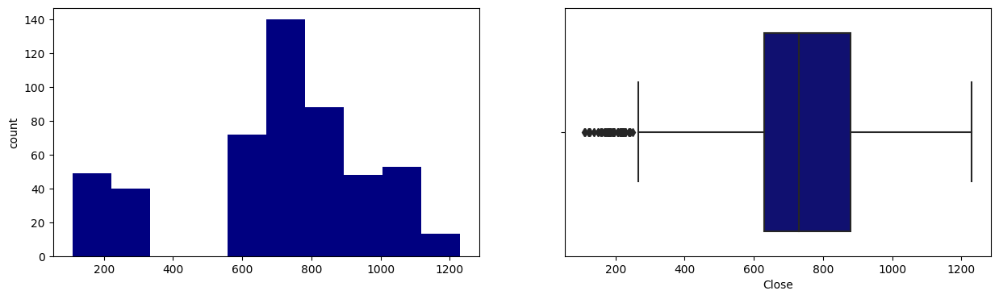

Previous Day Price
Skew : -0.65


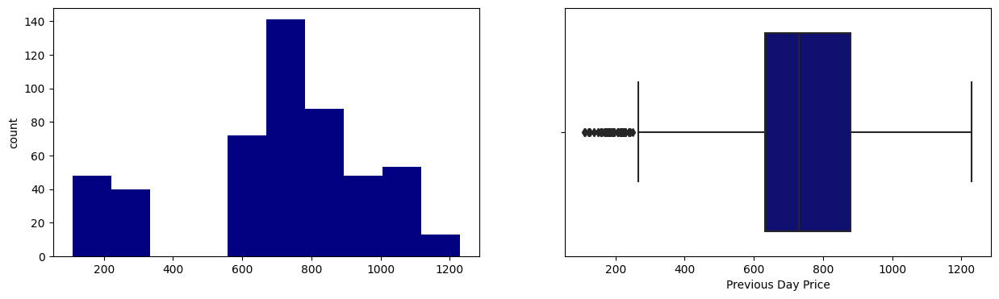

Volume
Skew : 2.85


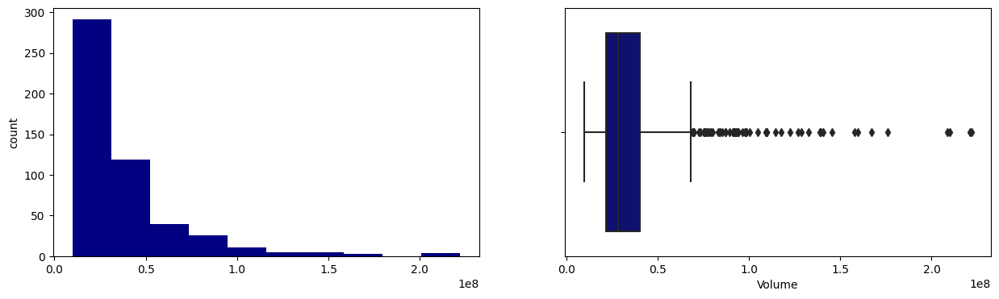

netReceivables
Skew : 1.55


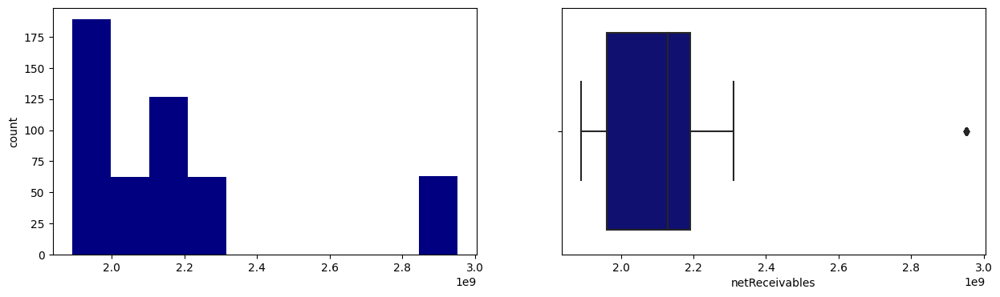

inventory
Skew : 0.83


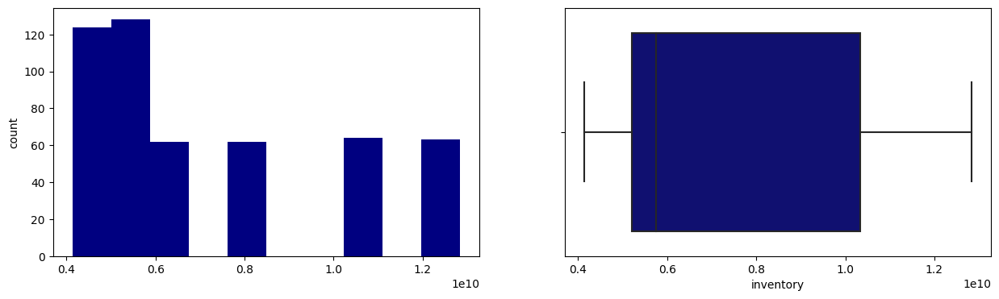

propertyPlantEquipmentNet
Skew : -0.31


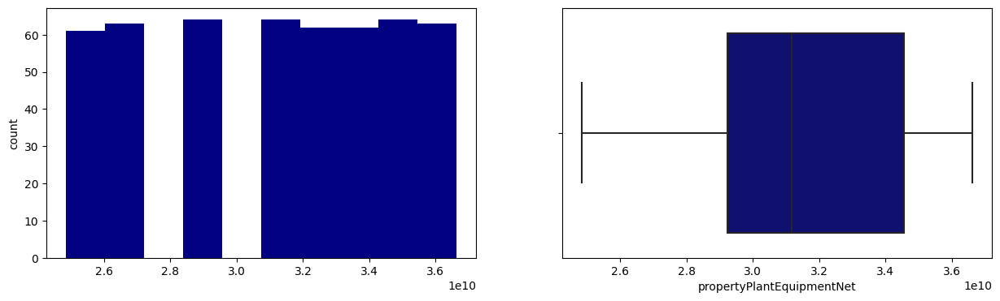

totalCurrentAssets
Skew : 0.87


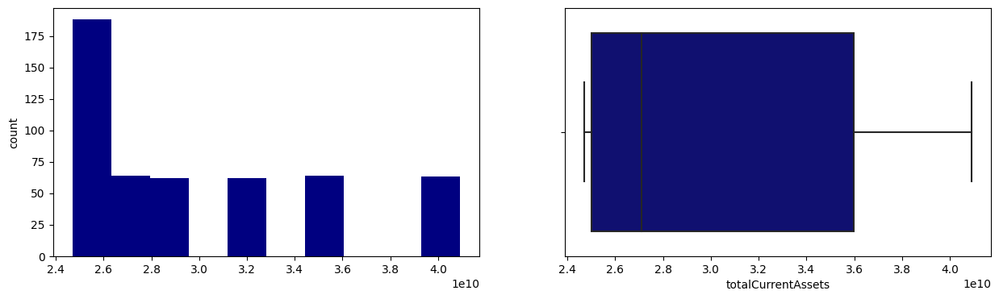

totalLiabilities
Skew : 1.12


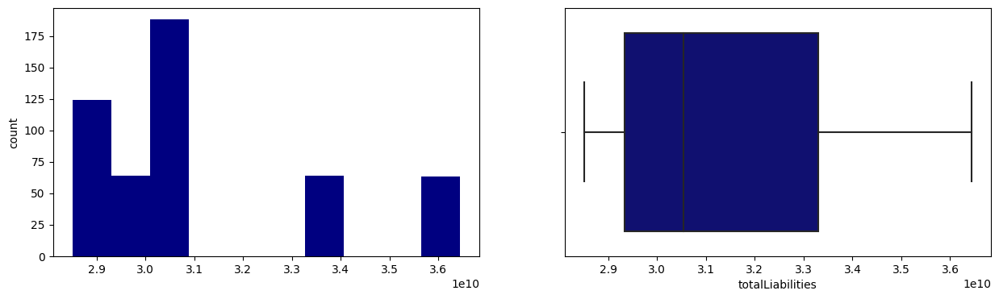

totalEquity
Skew : 0.27


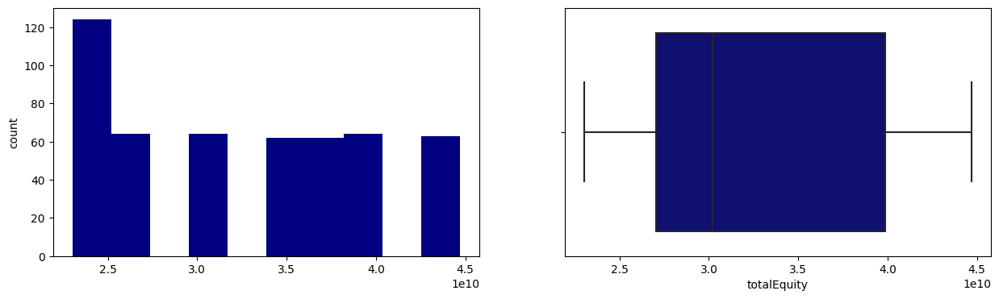

totalDebt
Skew : 0.36


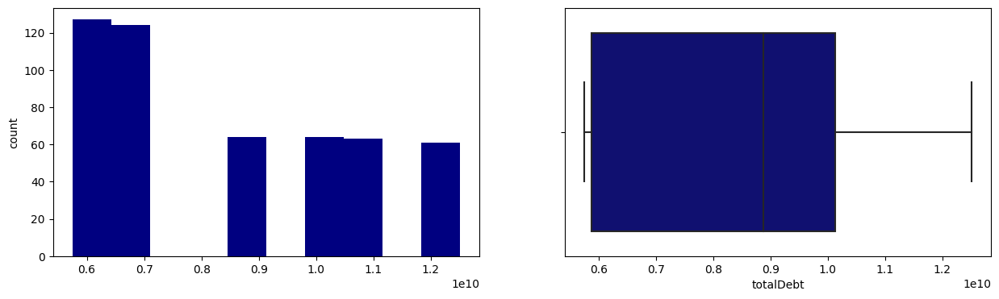

totalCurrentLiabilities
Skew : 0.15


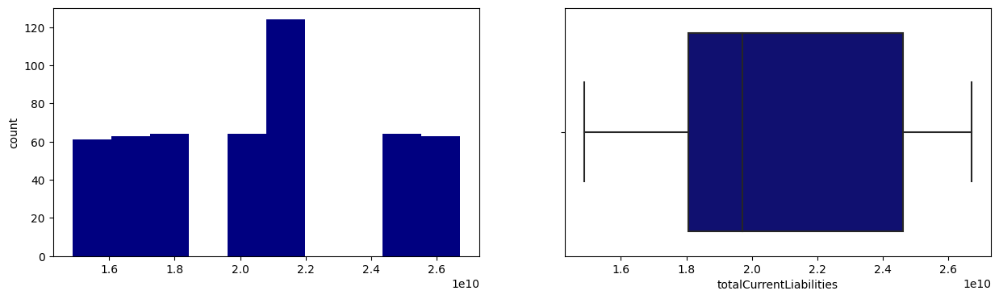

revenue
Skew : 0.11


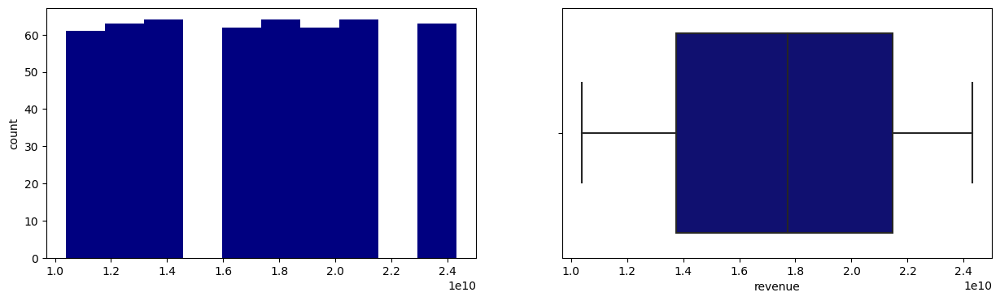

grossProfit
Skew : -0.44


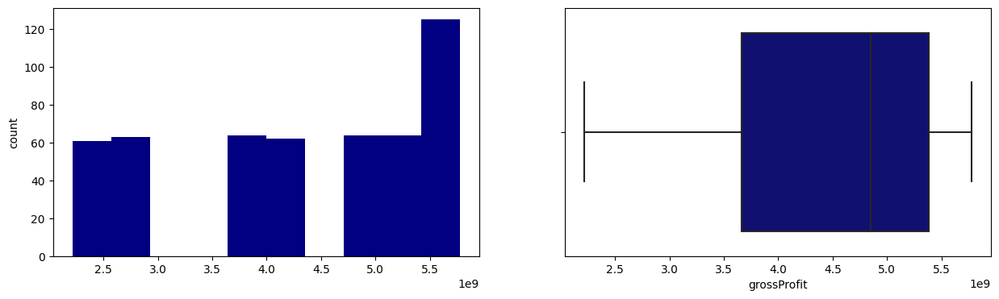

operatingExpenses
Skew : 1.26


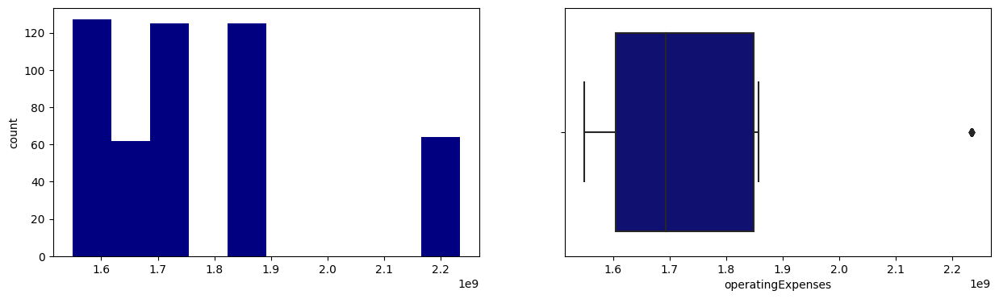

ebitda
Skew : -0.34


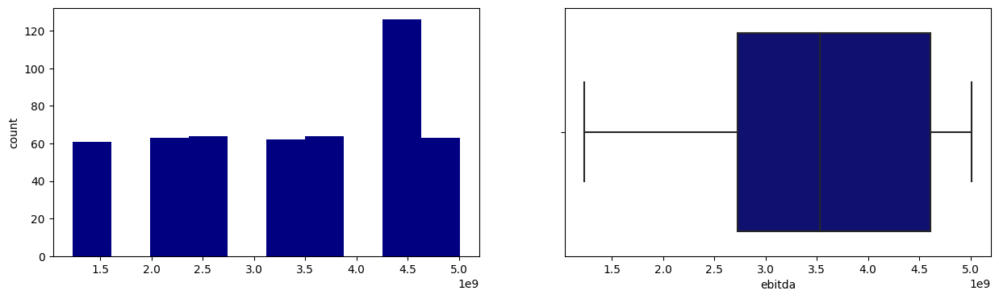

operatingIncome
Skew : -0.44


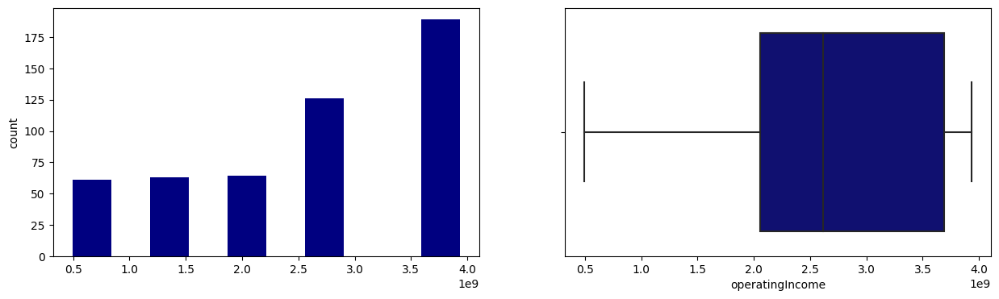

netIncome
Skew : -0.25


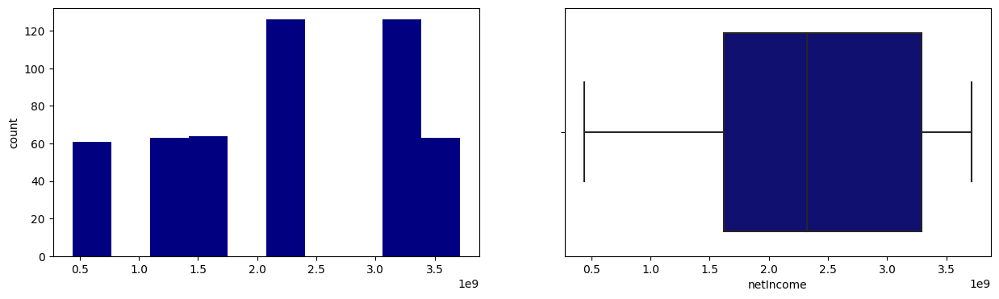

eps
Skew : -0.29


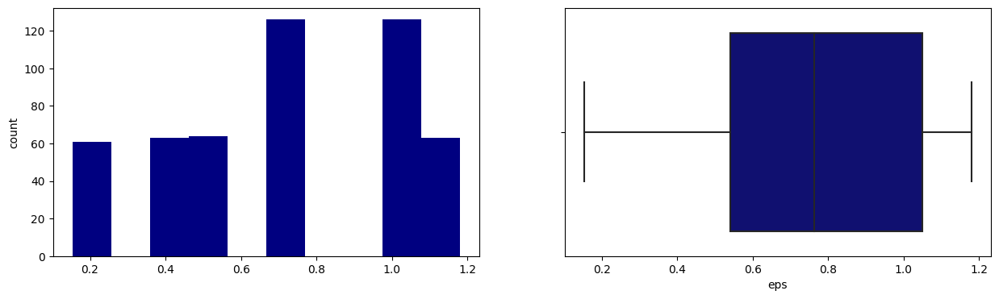

accountsReceivables
Skew : -0.63


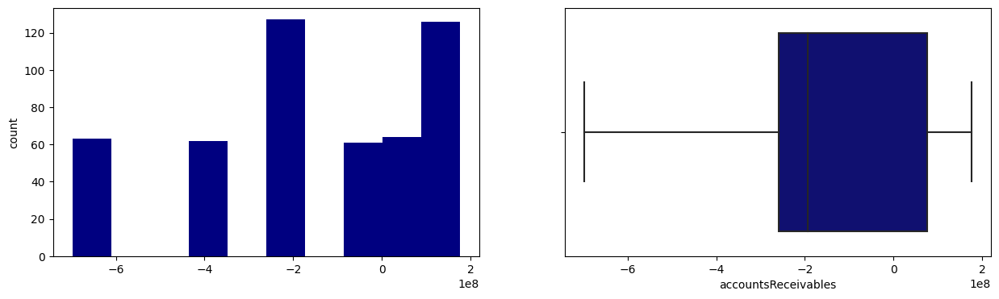

accountsPayables
Skew : 0


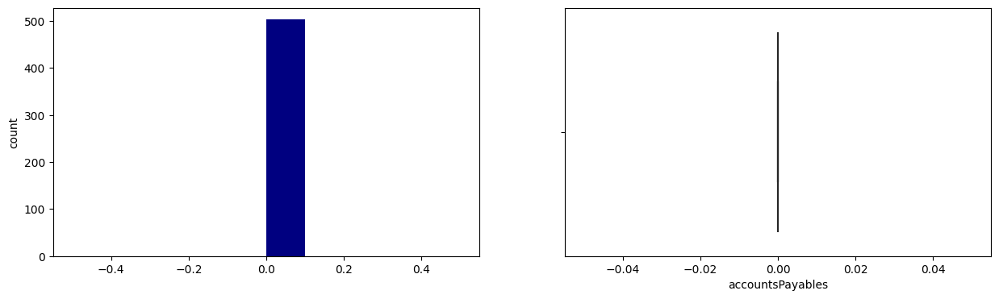

dividendsPaid
Skew : 0


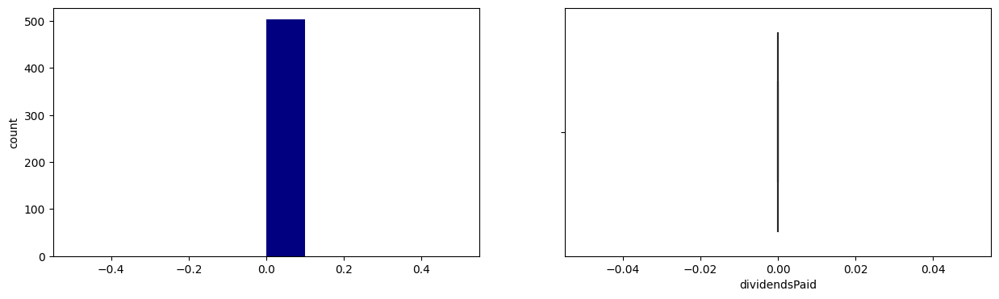

operatingCashFlow
Skew : 0.15


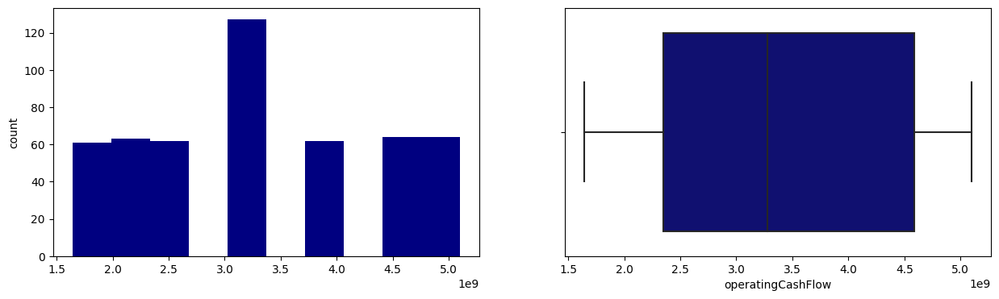

capitalExpenditure
Skew : -1.97


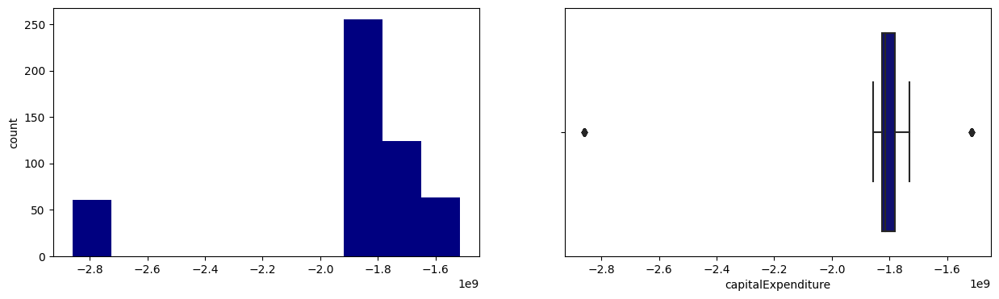

numberOfShares
Skew : -0.46


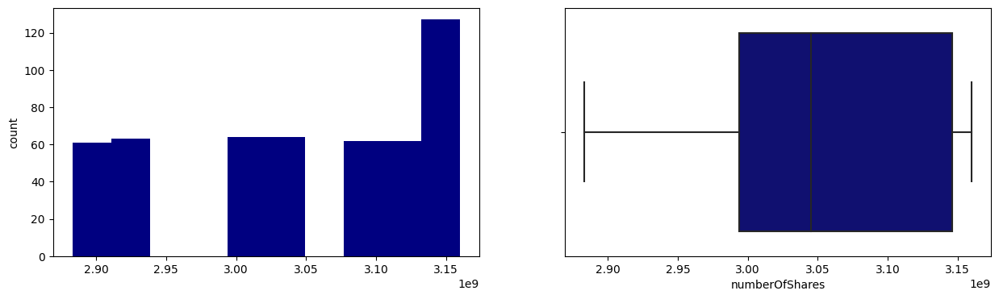

marketCapitalization
Skew : 0.06


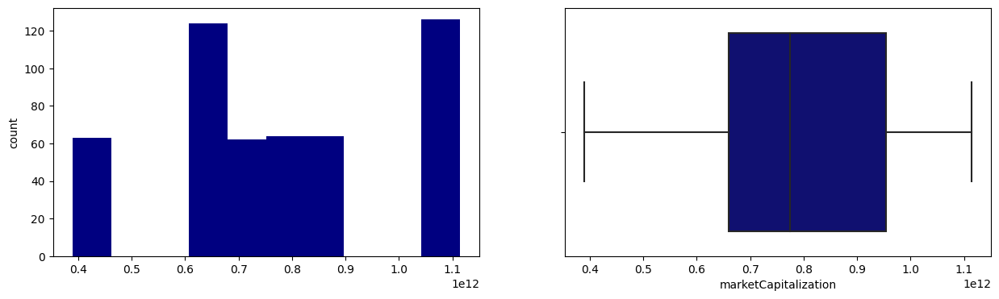

addTotalDebt
Skew : 0.36


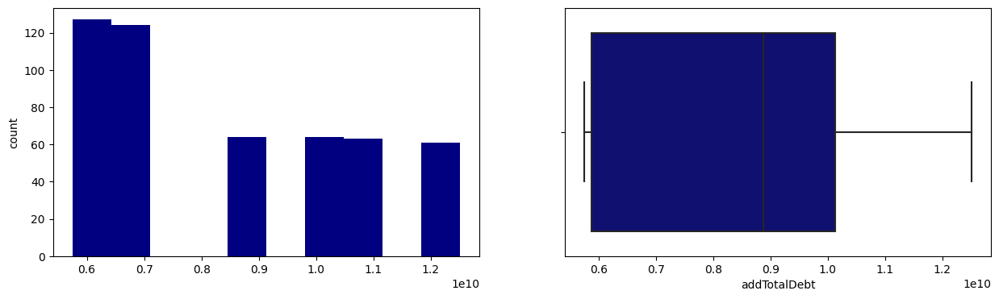

enterpriseValue
Skew : 0.05


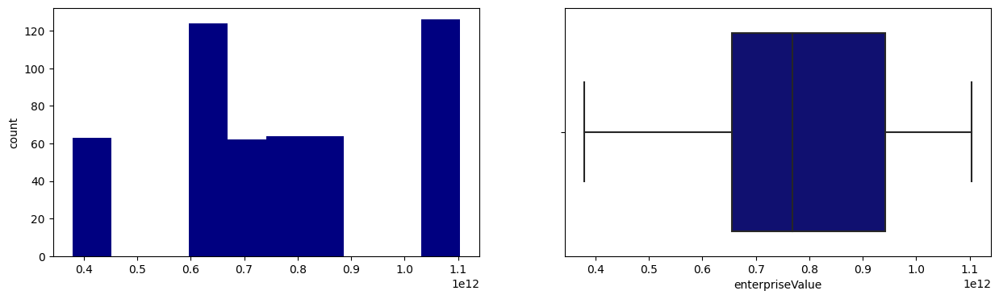

EnvironmentScore
Skew : 0.38


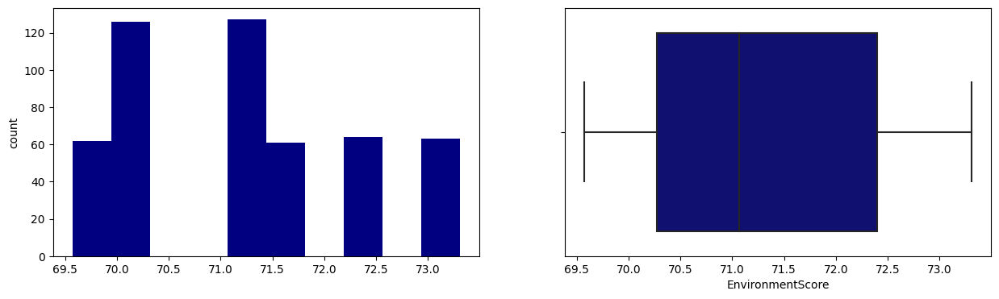

SocialScore
Skew : 0.4


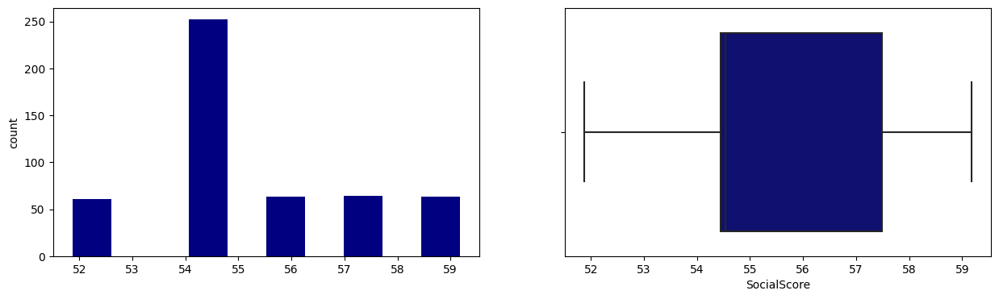

GovernanceScore
Skew : -0.59


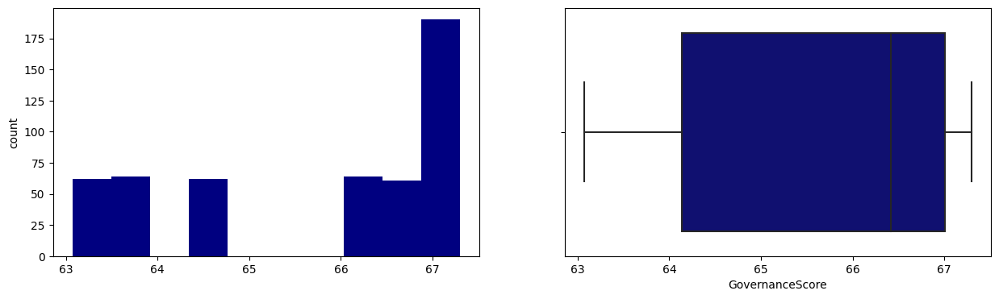

ESGscore
Skew : 0.57


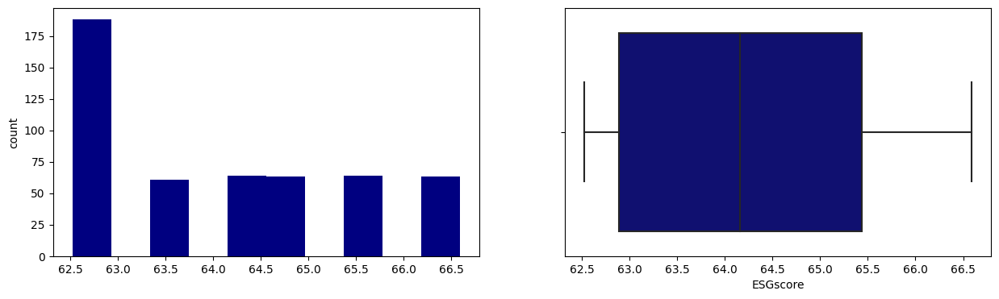

No of mentions
Skew : 1.04


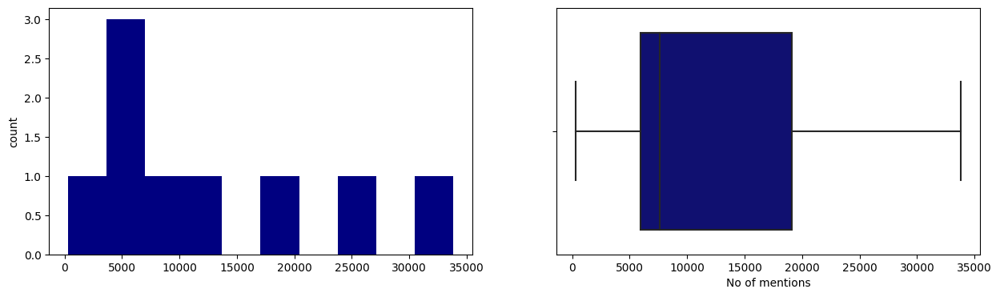

AvgPositiveScore
Skew : 0.14


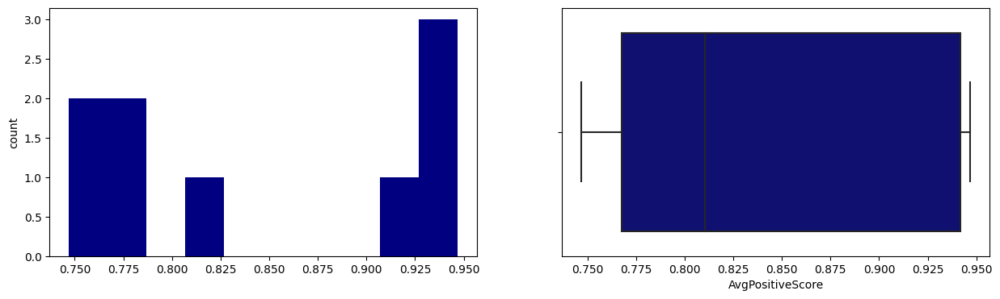

AvgNegativeScore
Skew : -0.22


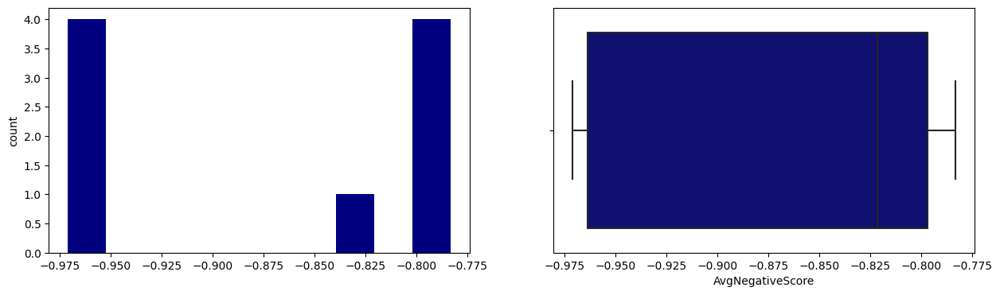

TotPositiveMentions
Skew : -0.07


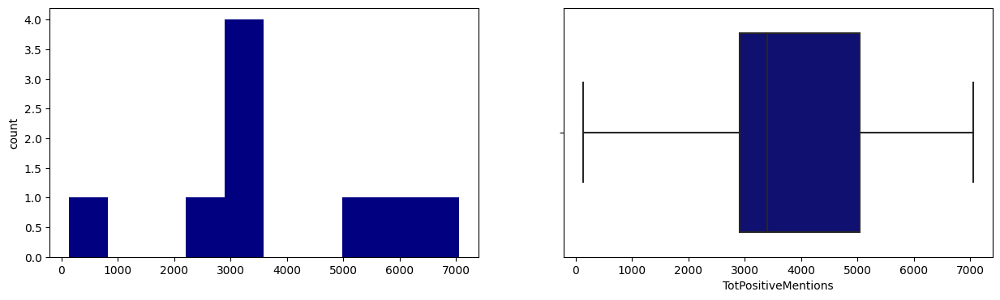

TotNegativeMentions
Skew : 1.14


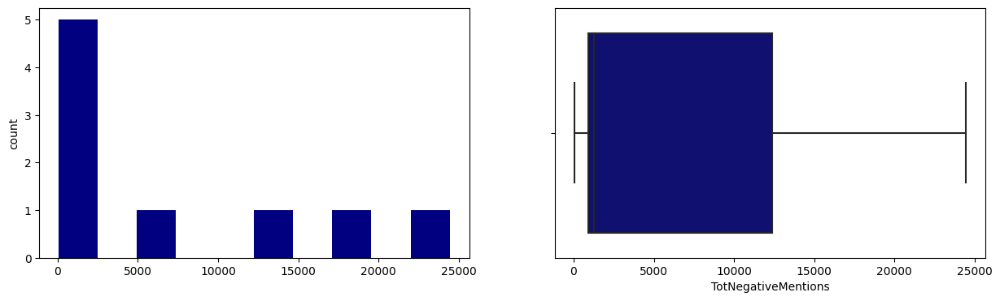

Count transaction (disposed)
Skew : 1.39


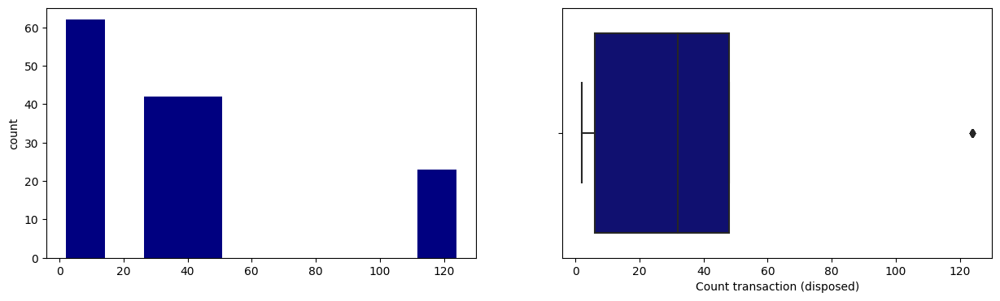

Total Amount (disposed)
Skew : 0.91


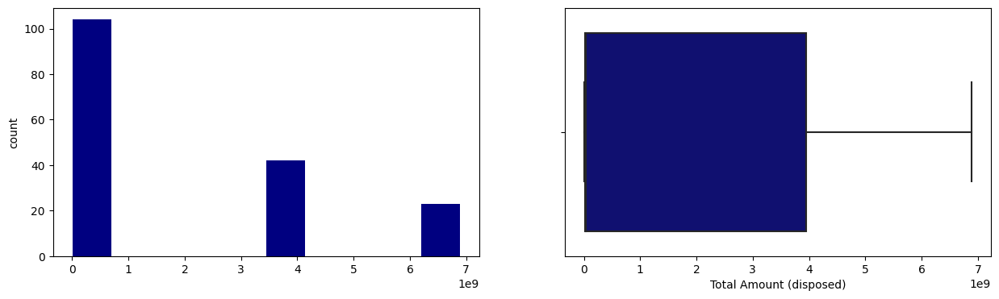

No of shares (disposed)
Skew : 1.65


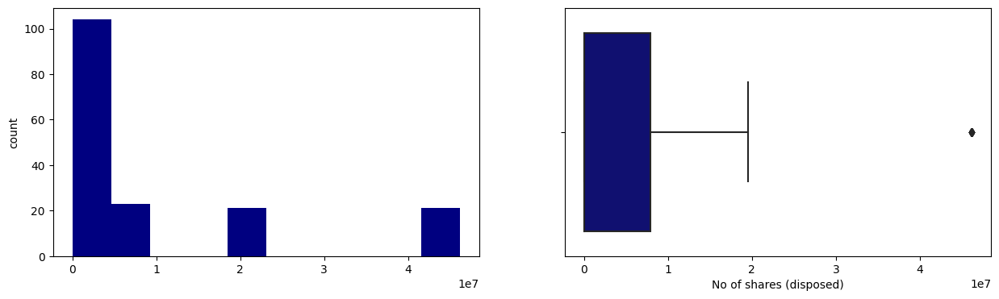

Avg Share Price (disposed) 
Skew : -0.05


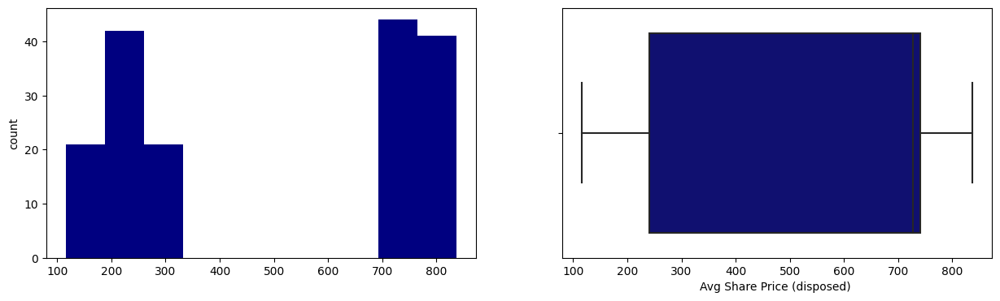

Min price (disposed)
Skew : 0.28


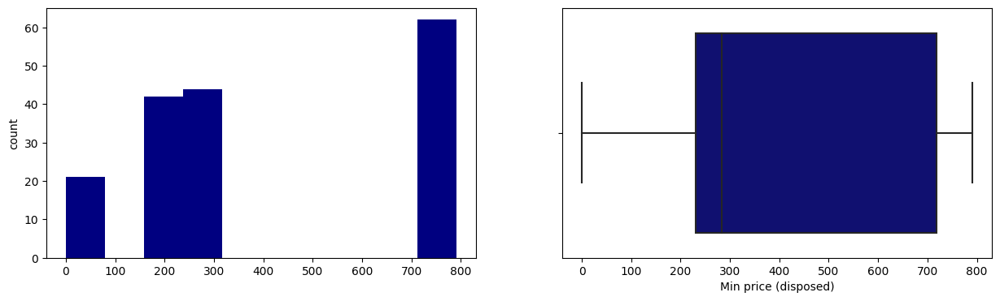

Max Price (disposed)
Skew : 0.01


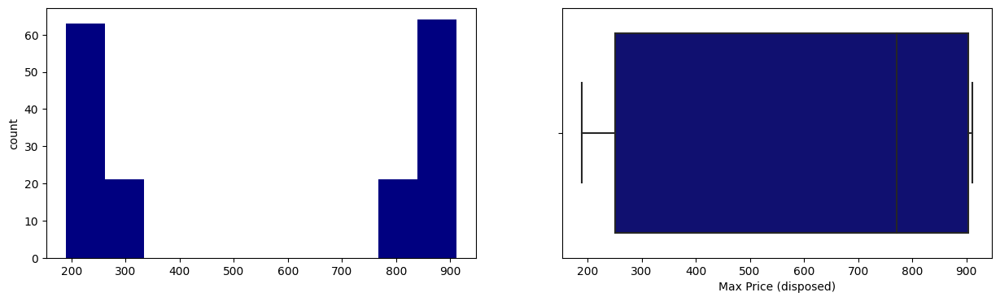

Count Acquired
Skew : 0.41


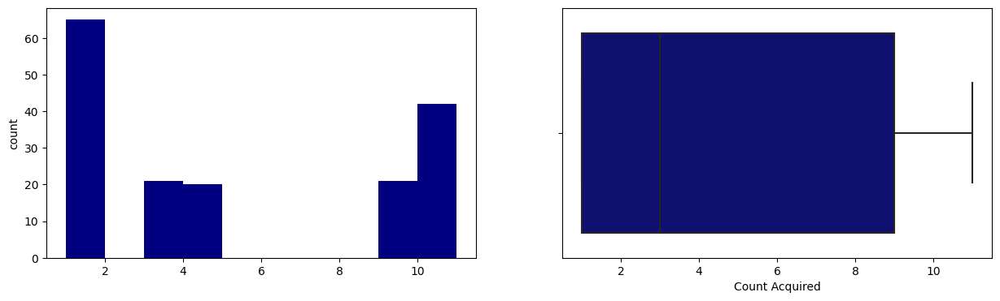

Total Amount(Acquired)
Skew : 1.08


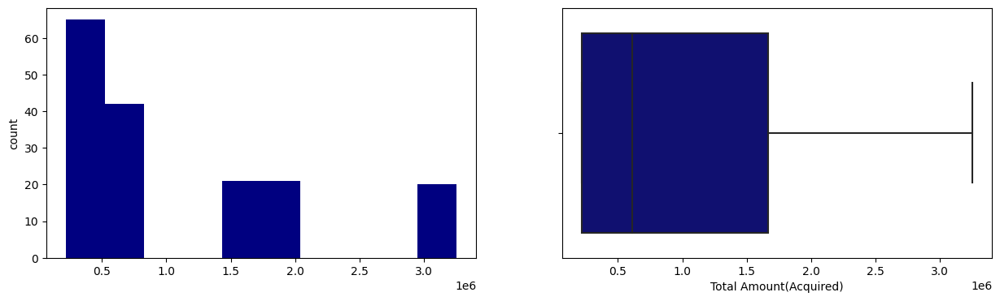

No of Shares(Acquired)
Skew : 0.05


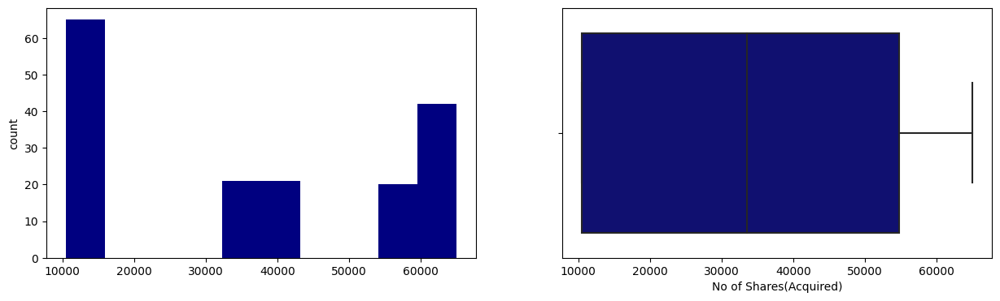

Avg Share Price (Acquired)
Skew : 0.65


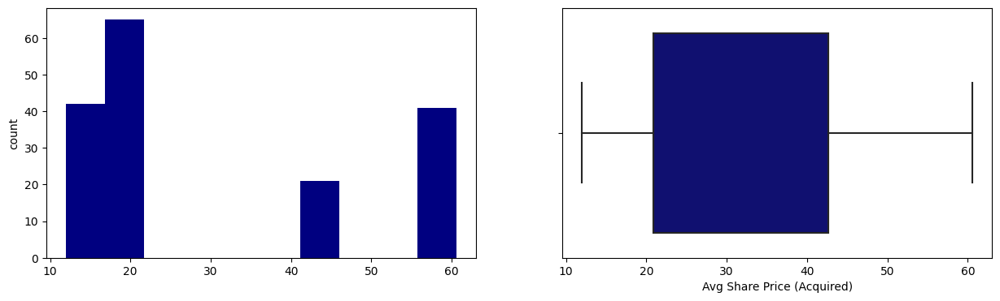

min price (Acquired)
Skew : 0.49


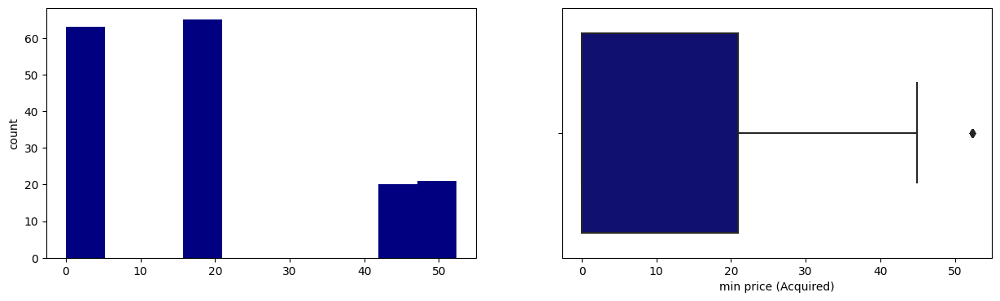

Max Price (Acquired)
Skew : 0.63


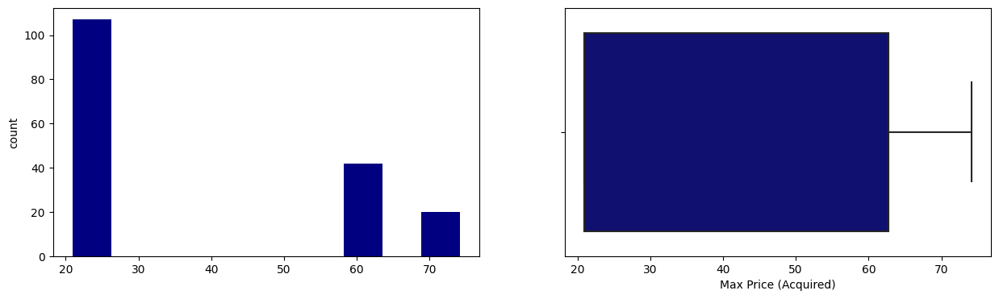

InflationRate
Skew : -0.89


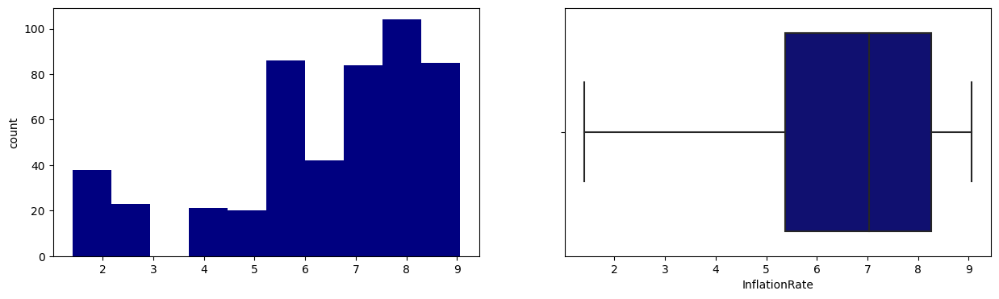

Value - T
Skew : -0.24


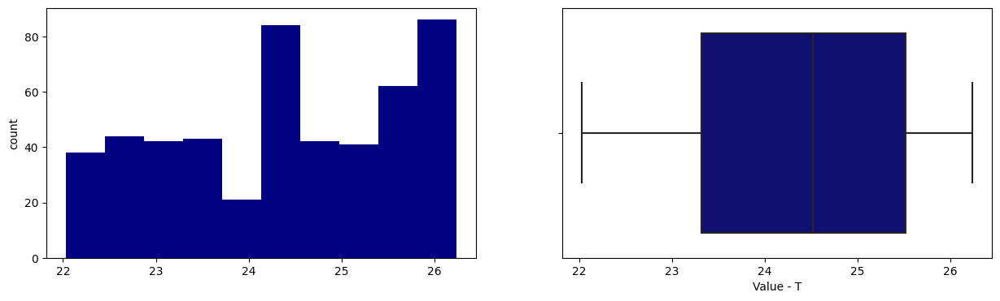

Year
Skew : 0.0


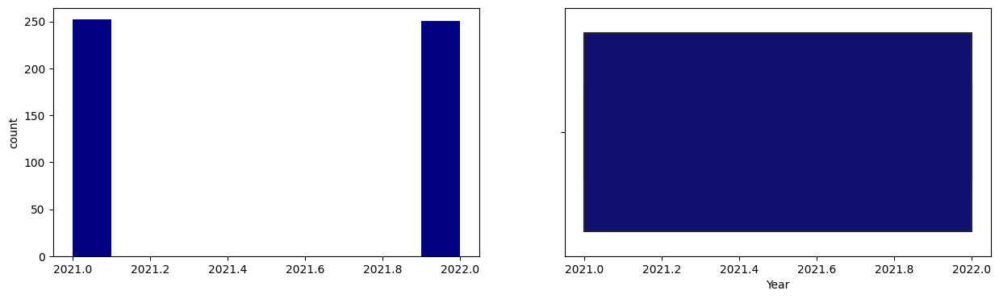

Quarter
Skew : -0.02


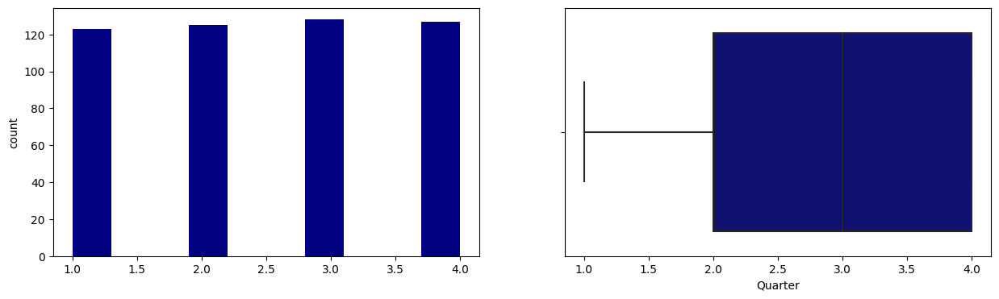

Day
Skew : 0.01


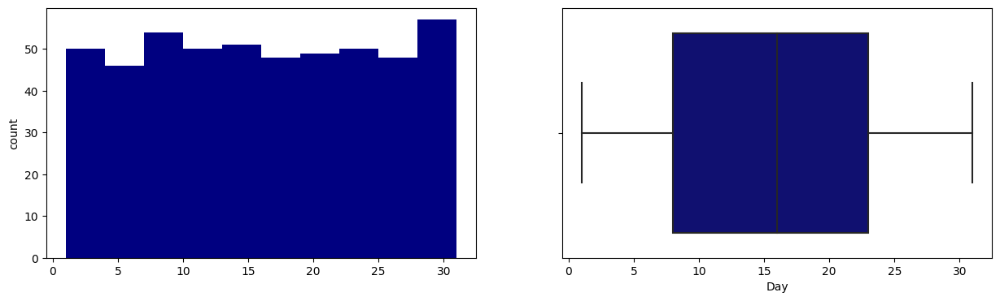

In [14]:
for col in num_cols:
    print(col)
    print('Skew :', round(newstocks_df[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    newstocks_df[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=newstocks_df[col])
    plt.show()

In [15]:
newstocks_df.describe()

,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
count,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,9.00,9.00,9.00,9.00,9.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,169.00,503.00,503.00,503.00,503.00,503.00
mean,707.43,708.59,38919302.86,2178896620.28,7234071570.58,31247660039.76,29851266401.59,31076439363.82,32535934393.64,8483749502.98,20469457256.46,16937210735.59,4315471172.96,1767111332.01,3401622266.40,2548359840.95,2268795228.63,0.74,-156582504.97,0.00,0.00,3290510934.39,-1894491053.68,3044747514.91,773802592661.23,8483749502.98,764957441567.79,71.23,55.28,65.73,64.08,12772.56,0.85,-0.87,3760.22,7217.89,36.74,1886151551.22,9261119.81,492.95,395.53,556.94,4.96,1066029.40,35833.93,30.87,19.87,37.60,6.37,24.40,2021.50,2.51,15.66
std,267.98,266.70,31023059.80,322234586.49,2837850324.63,3706974778.13,5568068516.51,2468021745.14,7111188252.34,2386147686.49,3761227979.00,4419876514.76,1208207792.72,205261352.04,1251392714.36,1128862742.49,1073564212.96,0.33,276883273.71,0.00,0.00,1142551852.84,372770781.04,98013912.08,221744444206.12,2386147686.49,221245609299.68,1.15,2.09,1.56,1.34,10828.28,0.09,0.09,1990.98,8856.28,38.40,2545393184.28,15372826.57,288.08,278.49,319.11,4.05,1000813.83,22437.88,18.41,18.85,22.23,2.12,1.26,0.50,1.12,8.77
min,109.10,109.10,9800558.00,1890000000.00,4132000000.00,24844000000.00,24693000000.00,28507000000.00,23017000000.00,5748000000.00,14877000000.00,10389000000.00,2215000000.00,1549000000.00,1227000000.00,493000000.00,438000000.00,0.15,-698000000.00,0.00,0.00,1641000000.00,-2860000000.00,2883000000.00,389248800000.00,5748000000.00,378743800000.00,69.57,51.87,63.07,62.52,327.00,0.75,-0.97,139.00,66.00,2.00,3353850.00,14250.00,115.86,0.00,189.50,1.00,219555.00,10500.00,11.97,0.00,20.91,1.40,22.03,2021.00,1.00,1.00
25%,630.56,633.24,22031158.50,1962000000.00,5199000000.00,29248000000.00,25002000000.00,29340000000.00,27053000000.00,5874000000.00,18051000000.00,13757000000.00,3660000000.00,1605000000.00,2728000000.00,2055000000.00,1618000000.00,0.54,-259000000.00,0.00,0.00,2351000000.00,-1825000000.00,2994000000.00,659988797100.00,5874000000.00,654892797100.00,70.27,54.44,64.14,62.89,5950.00,0.77,-0.96,2906.00,898.00,6.00,24776846.00,32989.00,240.22,229.95,250.50,1.00,219555.00,10500.00,20.91,0.00,20.91,5.37,23.32,2021.00,2.00,8.00
50%,730.91,730.91,28639305.00,2129000000.00,5757000000.00,31176000000.00,27100000000.00,30548000000.00,30189000000.00,8873000000.00,19705000000.00,17719000000.00,4847000000.00,1694000000.00,3532000000.00,2613000000.00,2321000000.00,0.76,-193000000.00,0.00,0.00,3278000000.00,-1814000000.00,3045000000.00,773928940200.00,8873000000.00,767989940200.00,71.07,54.53,66.42,64.16,7626.00,0.81,-0.82,3398.00,1274.00,32.00,28552428.00,53103.00,726.97,283.00,771.40,3.00,613043.00,33500.00,20.91,20.91,20.91,7.04,24.52,2021.00,3.00,16.00
75%,878.70,878.70,40565587.50,2192000000.00,10327000000.00,34563000000.00,35990000000.00,33302000000.00,39851000000.00,10126000000.00,24611000000.00,21454000000

Notes on tesla univariate 



#### END of numerical univariate

#### filter to remove abnormal stock BRK.A newstocks_df

### Univariate - Categorical 

#### Price Change

In [16]:
#proportion of categories of accident severity variable
newstocks_df["Price Change"].value_counts(normalize=True)

Increase   0.51
Decrease   0.49
Constant   0.00
Name: Price Change, dtype: float64

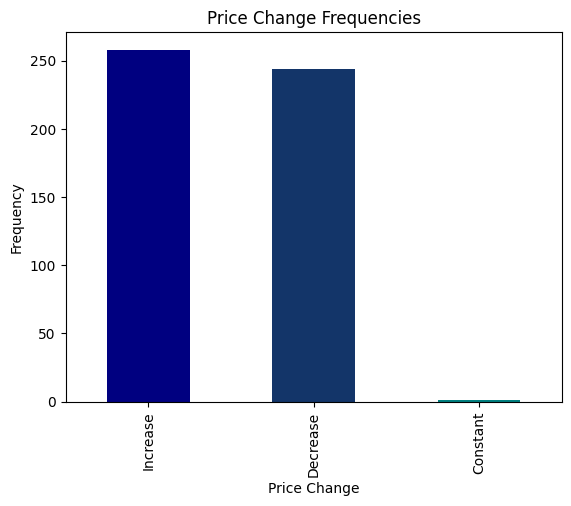

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the pastel color palette
#pastel_colors = sns.color_palette('crest')

# Visualisation of Price Change categories' frequencies
ax = newstocks_df["Price Change"].value_counts().plot(kind="bar", color= custom_palette)

# Set the plot labels
ax.set_title("Price Change Frequencies")
ax.set_xlabel("Price Change")
ax.set_ylabel("Frequency")

# Show the plot
plt.show()


In [18]:
Freq_df =(pd.DataFrame((newstocks_df[['Price Change','Ticker', 'Market Capitalization','Sector','Industry','IsCovidYear', 'Month', 'Day of Week']].describe())))

Freq_df

,Price Change,Ticker,Market Capitalization,Sector,Industry,IsCovidYear,Month,Day of Week
count,503,503,503,503,503,503,503,503
unique,3,1,1,1,1,1,12,5
top,Increase,TSLA,Large-cap,Auto Manufacturers - Major,Consumer Discretionary,PostCovid,March,Wednesday
freq,258,503,503,503,503,503,46,104


In [19]:
#data cleaning on market capitalization field 

import pandas as pd

# Create a sample DataFram

# Merge records and assign the same name code
merged_name_code = 'Large-cap'
newstocks_df.loc[newstocks_df['Market Capitalization'].isin(['Large-cap', 'Large-Cap']), 'Market Capitalization'] = merged_name_code

# Print the updated DataFrame
print(newstocks_df)


        Close  Previous Day Price Price Change     Volume Ticker  \
53279  123.18              121.82     Increase  157777339   TSLA   
53280  121.82              112.71     Increase  221923313   TSLA   
53281  112.71              109.10     Increase  221070537   TSLA   
53282  109.10              123.15     Decrease  208643444   TSLA   
53283  123.15              125.35     Decrease  166989688   TSLA   
53284  125.35              137.57     Decrease  210090250   TSLA   
53285  137.57              137.80     Decrease  145417412   TSLA   
53286  137.80              149.87     Decrease  159563267   TSLA   
53287  149.87              150.23     Decrease  139390634   TSLA   
53288  150.23              157.67     Decrease  139032175   TSLA   
53289  157.67              156.80     Increase  122334459   TSLA   
53290  156.80              160.95     Decrease  140682338   TSLA   
53291  160.95              167.82     Decrease  175862722   TSLA   
53292  167.82              179.05     Decrease  

### Statistical analysis for categorical variables 

In [20]:
Freq_df =(pd.DataFrame((newstocks_df[['Price Change','Ticker', 'Market Capitalization','Sector','Industry','IsCovidYear', 'Month', 'Day of Week']].describe())))

Freq_df

,Price Change,Ticker,Market Capitalization,Sector,Industry,IsCovidYear,Month,Day of Week
count,503,503,503,503,503,503,503,503
unique,3,1,1,1,1,1,12,5
top,Increase,TSLA,Large-cap,Auto Manufacturers - Major,Consumer Discretionary,PostCovid,March,Wednesday
freq,258,503,503,503,503,503,46,104


In [21]:
#Getting the value counts of the light_conditions variable
values = pd.DataFrame(newstocks_df.loc[:,'Day of Week'].value_counts())
values.columns = ['Day of Week']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Day of Week'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Day of Week %']
values.join(percentages)

,Day of Week,Day of Week %
Wednesday,104,20.68%
Tuesday,104,20.68%
Thursday,102,20.28%
Friday,101,20.08%
Monday,92,18.29%


In [22]:
#Getting the value counts of the price change variable
values = pd.DataFrame(newstocks_df.loc[:,'Price Change'].value_counts())
values.columns = ['Price Change']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Price Change'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Price Change %']
values.join(percentages)

,Price Change,Price Change %
Increase,258,51.29%
Decrease,244,48.51%
Constant,1,0.2%


In [23]:
#Getting the value counts of the Ticker variable
values = pd.DataFrame(newstocks_df.loc[:,'Ticker'].value_counts())
values.columns = ['Ticker']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Ticker'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Ticker %']
values.join(percentages)

,Ticker,Ticker %
TSLA,503,100.0%


In [24]:
#Getting the value counts of the Sector variable
values = pd.DataFrame(newstocks_df.loc[:,'Sector'].value_counts())
values.columns = ['Sector']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Sector'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Sector %']
values.join(percentages)

,Sector,Sector %
Auto Manufacturers - Major,503,100.0%


In [25]:
#Getting the value counts of the Industry variable
values = pd.DataFrame(newstocks_df.loc[:,'Industry'].value_counts())
values.columns = ['Industry']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Industry'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Industry %']
values.join(percentages)

,Industry,Industry %
Consumer Discretionary,503,100.0%


In [26]:
#Getting the value counts of the Market Capitalization variable
values = pd.DataFrame(newstocks_df.loc[:,'Market Capitalization'].value_counts())
values.columns = ['Market Capitalization']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Market Capitalization'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Market Capitalization %']
values.join(percentages)

,Market Capitalization,Market Capitalization %
Large-cap,503,100.0%


In [27]:
#Getting the value counts of the IsCovidYear variable
values = pd.DataFrame(newstocks_df.loc[:,'IsCovidYear'].value_counts())
values.columns = ['IsCovidYear']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'IsCovidYear'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['IsCovidYear %']
values.join(percentages)

,IsCovidYear,IsCovidYear %
PostCovid,503,100.0%


In [28]:
#Getting the value counts of the Month variable
values = pd.DataFrame(newstocks_df.loc[:,'Month'].value_counts())
values.columns = ['Month']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Month'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Month %']
values.join(percentages)

,Month,Month %
March,46,9.15%
August,45,8.95%
December,43,8.55%
June,43,8.55%
November,42,8.35%
October,42,8.35%
September,42,8.35%
July,41,8.15%
May,41,8.15%
April,41,8.15%


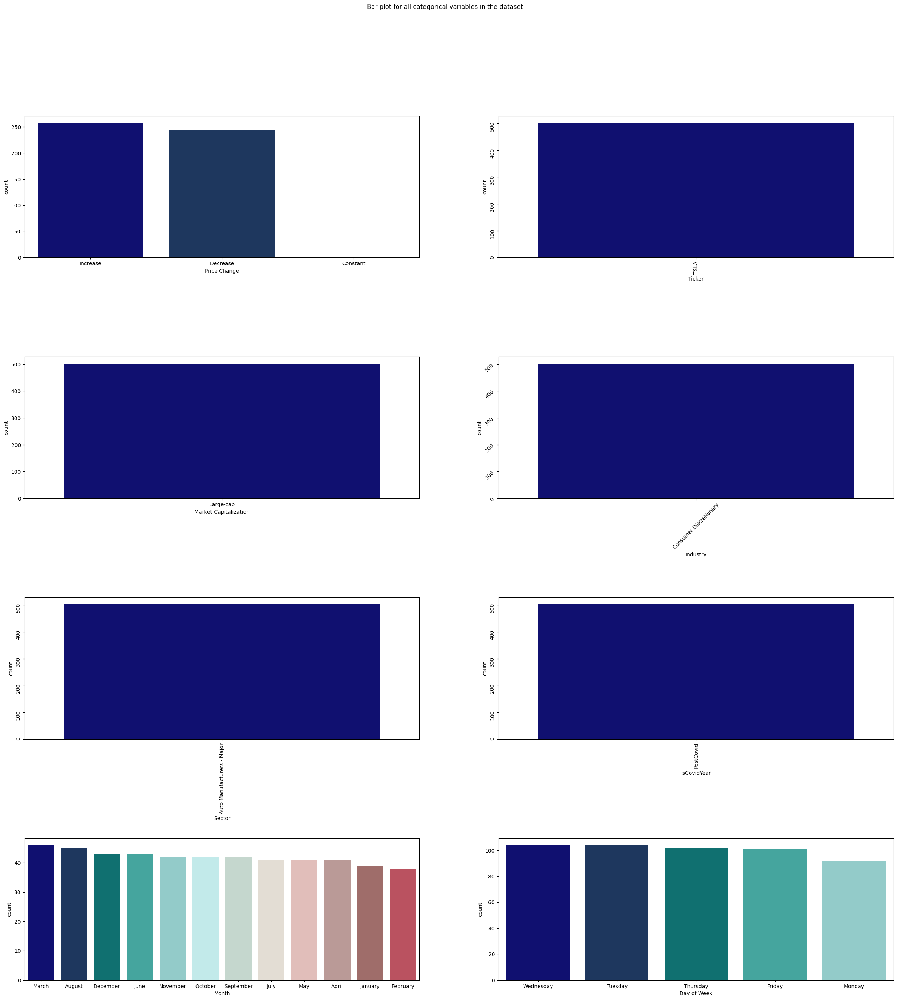

In [29]:
fig, axes = plt.subplots(4, 2, figsize = (30, 30))
fig.suptitle('Bar plot for all categorical variables in the dataset')
sns.countplot(ax = axes[0, 0], x = 'Price Change', data = newstocks_df,
              order = newstocks_df['Price Change'].value_counts().index);
sns.countplot(ax = axes[0, 1], x = 'Ticker', data = newstocks_df, palette = custom_palette,
              order = newstocks_df['Ticker'].value_counts().index);
sns.countplot(ax = axes[1, 0], x = 'Market Capitalization', data = newstocks_df,
              order = newstocks_df['Market Capitalization'].value_counts().index);
sns.countplot(ax = axes[1, 1], x = 'Industry', data = newstocks_df, palette = custom_palette,
              order = newstocks_df['Industry'].value_counts().index);
sns.countplot(ax = axes[2, 0], x = 'Sector', data = newstocks_df, palette = custom_palette,
              order = newstocks_df['Sector'].value_counts().index);
sns.countplot(ax = axes[2, 1], x = 'IsCovidYear', data = newstocks_df,
              order = newstocks_df['IsCovidYear'].value_counts().index);
sns.countplot(ax = axes[3, 0], x = 'Month', data = newstocks_df,palette = custom_palette,
              order = newstocks_df['Month'].value_counts().index);
sns.countplot(ax = axes[3, 1], x = 'Day of Week', data = newstocks_df, 
              order = newstocks_df['Day of Week'].value_counts().index);


axes[0][1].tick_params(labelrotation=90);
axes[1][1].tick_params(labelrotation=45);
axes[2][0].tick_params(labelrotation=90);
axes[2][1].tick_params(labelrotation=90);


plt.subplots_adjust(hspace=0.7)
plt.subplots_adjust(wspace=0.2)

In [30]:
newstocks_df

,Close,Previous Day Price,Price Change,Volume,Ticker,Market Capitalization,Industry,Sector,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,IsCovidYear,Date,Year,Quarter,Month,Day,Day of Week
53279,123.18,121.82,Increase,157777339,TSLA,Large-cap,Consumer Discretionary,Auto Manufacturers - Major,2952000000.00,12839000000.00,36635000000.00,40917000000.00,36440000000.00,44704000000.00,5748000000.00,26709000000.00,24318000000.00,5777000000.00,1842000000.00,5012000000.00,3935000000.00,3714000000.00,1.18,-698000000.00,0.00,0.00,3278000000.00,-1858000000.00,3160000000.00,389248800000.00,5748000000.00,378743800000.00,73.31,59.18,67.30,66.59,11191.00,0.94,-0.96,3398.00,6780.00,48.00,3585265058.00,46163354.00,115.86,0.00,189.50,10.00,714671.00,65033.00,13.12,0.00,20.91,6.45,26.09,PostCovid,2022-12-30,2022,4,December,30,Friday
53280,121.82,112.71,Increase,221923313,TSLA,Large-cap,Consumer Discretionary,Auto Manufacturers - Major,2952000000.00,12839000000.00,36635000000.00,40917000000.00,36440000000.00,44704000000.00,5748000000.00,26709000000.00,24318000000.00,5777000000.00,1842000000.00,5012000000.00,3935000000.00,3714000000.00,1.18,-698000000.00,0.00,0.00,3278000000.00,-1858000000.00,3160000000.00,389248800000.00,5748000000.00,378743800000.00,73.31,59.18,67.30,66.59,19084.00,0.95,-0.97,5034.00,12392.00,48.00,3585265058.00,46163354.00,115.86,0.00,189.50,10.00,714671.00,65033.00,13.12,0.00,20.91,6.45,26.09,PostCovid,2022-12-29,2022,4,December,29,Thursday
53281,112.71,109.10,Increase,221070537,TSLA,Large-cap,Consumer Discretionary,Auto Manufacturers - Major,2952000000.00,12839000000.00,36635000000.00,40917000000.00,36440000000.00,44704000000.00,5748000000.00,26709000000.00,24318000000.00,5777000000.00,1842000000.00,5012000000.00,3935000000.00,3714000000.00,1.18,-698000000.00,0.00,0.00,3278000000.00,-1858000000.00,3160000000.00,389248800000.00,5748000000.00,378743800000.00,73.31,59.18,67.30,66.59,33790.00,0.94,-0.97,7048.00,24430.00,48.00,3585265058.00,46163354.00,115.86,0.00,189.50,10.00,714671.00,65033.00,13.12,0.00,20.91,6.45,26.09,PostCovid,2022-12-28,2022,4,December,28,Wednesday
53282,109.10,123.15,Decrease,208643444,TSLA,Large-cap,Consumer Discretionary,Auto Manufacturers - Major,2952000000.00,12839000000.00,36635000000.00,40917000000.00,36440000000.00,44704000000.00,5748000000.00,26709000000.00,24318000000.00,5777000000.00,1842000000.00,5012000000.00,3935000000.00,3714000000.00,1.18,-698000000.00,0.00,0.00,3278000000.00,-1858000000.00,3160000000.00,389248800000.00,5748000000.00,378743800000.00,73.31,59.18,67.30,66.59,24569.00,0.93,-0.96,5780.00,17195.00,48.00,3585265058.00,46163354.00,115.86,0.00,189.50,10.00,714671.00,65033.00,13.12,0.00,20.91,6.45,26.09,PostCovid,2022-12-27,2022,4,December,27,Tuesday
53283,123.15,125.35,Decrease,166989688,TSLA,Large-cap,Consumer Discretionary,Auto Manufacturers - Major,2952000000.00,12839000000.00,36635000000.00,40917000000.00,36440000000.00,44704000000.00,5748000000.00,26709000000.00,24318000000.00,5777000000.00,1842000000.00,5012000000.00,3935000000.00,3714000000.00,1.18,-698000000.00,0.00,0.00,3278000000.00,-1858000000.00,3160000000.00,389248800000.00,5748000000.00,378743800000.00,73.31,59.18,67.30,66.59,NaN,NaN,NaN,NaN,NaN,48.00,3585265058.00,46163354.00

#### Summary of Univariate Categorical Variables


Price Change - there are 3 unique fields, based on the distribution, alThough increase has the highest frequency, decrease is almost at par with it at 43%; while 13% of the data contains constant; as seen in the bar chart and frequency table below


Ticker - 50 unique tickers. the bar chart shows we have unequal datasets for the different data;PFE has the highest number of data while FB has the least; this shows that we do not have enough datasets for FB; Or data was lost for FB through the data gathering process. see tickers list; provide list and full name of tickers.

Market Capitalization - There are 3 unique fields, The majority of the distribution, which is over 50% of the data is Large capitalization stocks and the analysis contains very little mid capitalization stocks of abotu 2% of the data. 

Industry - The dataset covers 9 distinct industries; majority of the data is on the health care (27%) and technology industry(18%); while energy, industrials and utilities have lower percentage of about 2% the data.

Sectors - we have 39 unique sectors represented in the dataset of which credit services dominates the dataset by 9% and we have fewer data for gaming and capital markets stocks

Iscovidyear - there are 3 distinct covid status of which post covid dataset represents 50% of the data, this refers to data after covid (from january 2021).

Month - All the months are represented with October having the most datasets. 


Day of week - has an almost equal representation with Weekdays represented to show valid trading days. Monday has the least amount of records. 








## END of Univariate Visualizations 

BIVARIATE VISUALIZATION - ALL CATEGORICAL PREDICTORS VS NUMERICAL TARGET (PRICE) 

Summary from BiVariate Categorical Analysis against Target variable "Close - Price"

- BRK has the highest average price, followed by AMZN and GOOGL, TSLA, while ZOM, AYTU have the lowest mean prices
- Large Cap stocks have higher stock prices 
- Stocks in Consumer Discretionary Industry and communcation services have higher prices while those in enery and industrials have lower; stock in financials have the highest because of BRK which has an extreme value.
- Stocks in Insurance sector - BRK, Specialty retail(AMZN), Internet content and information (GOOGL) have higher prices, while most petty stocks were in the sector of diagnostics & research, medical instruments 
-Stocks had higher prices during Covid and lower prices before covid and also have a more reduced mean post covid. 
- Stocks had higher prices in April, though most of the bars show uniformity or equal mean prices
- Stocks were almost at par every day of the week, no particular day shows any pattern on the mean prices 
-Stocks prices were higher 2021 and 2020; and lowest 2022
- Stock prices show that they are higher in Quarter 2, though the bars show almost equal distribution



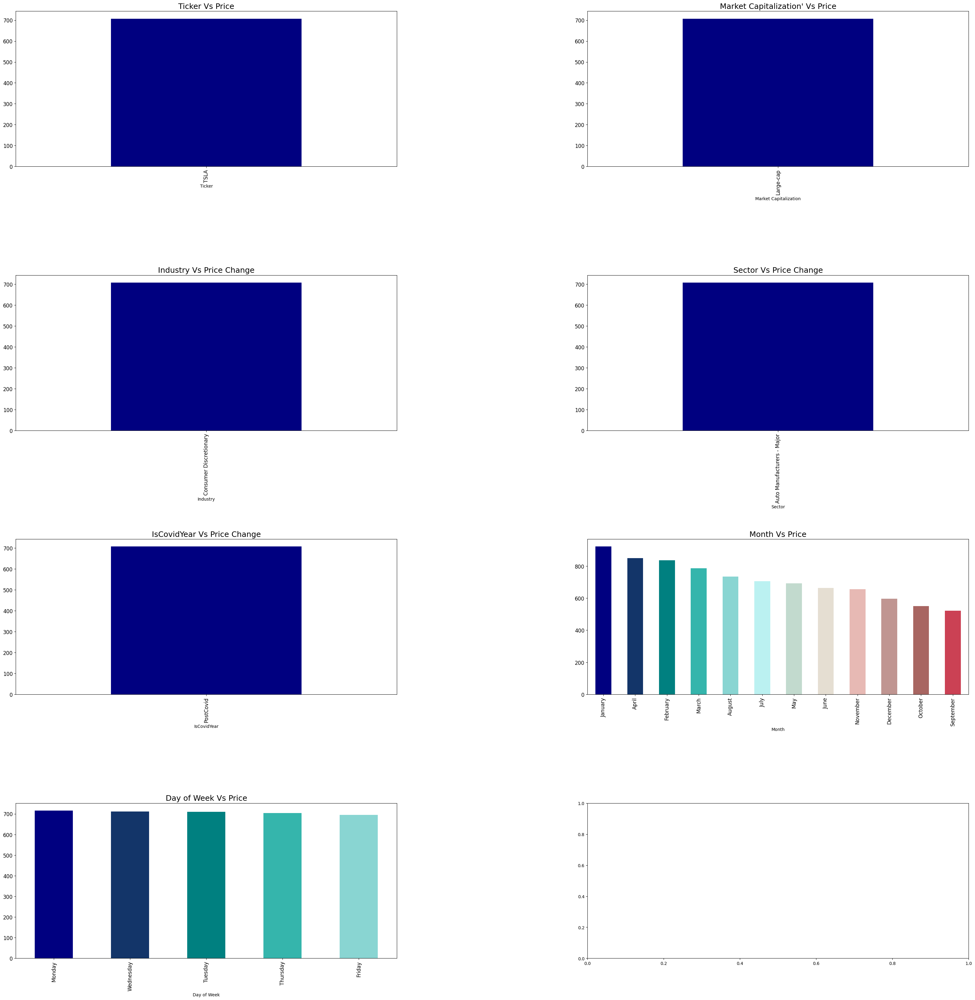

In [31]:
### RUn with BRK.

fig, axarr = plt.subplots(4, 2, figsize=(40, 40))
newstocks_df.groupby('Ticker')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][0], fontsize=12, color = custom_palette)
axarr[0][0].set_title("Ticker Vs Price", fontsize=18)
newstocks_df.groupby('Market Capitalization')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][1], fontsize=12, color = custom_palette)
axarr[0][1].set_title("Market Capitalization' Vs Price", fontsize=18)
newstocks_df.groupby('Industry')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[1][0], fontsize=12, color = custom_palette)
axarr[1][0].set_title("Industry Vs Price Change", fontsize=18)
newstocks_df.groupby('Sector')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[1][1], fontsize=12, color = custom_palette)
axarr[1][1].set_title("Sector Vs Price Change", fontsize=18)
newstocks_df.groupby('IsCovidYear')['Close'].mean().sort_values(ascending=False).head(10).plot.bar(ax=axarr[2][0], fontsize=12, color = custom_palette)
axarr[2][0].set_title("IsCovidYear Vs Price Change", fontsize=18)
newstocks_df.groupby('Month')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[2][1], fontsize=12, color = custom_palette )
axarr[2][1].set_title("Month Vs Price", fontsize=18)
newstocks_df.groupby('Day of Week')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[3][0], fontsize=12 , color = custom_palette)
axarr[3][0].set_title("Day of Week Vs Price", fontsize=18)

plt.subplots_adjust(hspace=0.7)
plt.subplots_adjust(wspace=0.5)
#sns.despine(palette = custom_palette)

                  



BIVARIATE VISUALIZATION NUMERICALS PREDICTORS VS NUMERICAL TARGET VARIABLE 

<Figure size 1300x1700 with 0 Axes>

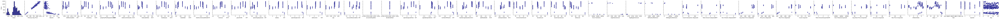

In [32]:
import seaborn as sns
import pandas as pd

plt.figure(figsize=(13,17))
# create sample dataframe
df = newstocks_df

# create pair plot
sns.pairplot(df, y_vars=['Close'], x_vars=['Close', 'Previous Day Price', 'Volume', 'netReceivables', 'inventory', 'propertyPlantEquipmentNet', 'totalCurrentAssets', 'totalLiabilities', 'totalEquity', 'totalDebt', 'totalCurrentLiabilities', 'revenue', 'grossProfit', 'operatingExpenses', 'ebitda', 'operatingIncome', 'netIncome', 'eps', 'accountsReceivables', 'accountsPayables', 'dividendsPaid', 'operatingCashFlow', 'capitalExpenditure', 'numberOfShares', 'marketCapitalization', 'addTotalDebt', 'enterpriseValue', 'EnvironmentScore', 'SocialScore', 'GovernanceScore', 'ESGscore', 'No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)', 'Count Acquired', 'Total Amount(Acquired)', 'No of Shares(Acquired)', 'Avg Share Price (Acquired)', 'min price (Acquired)', 'Max Price (Acquired)', 'InflationRate', 'Value - T', 'Year', 'Quarter', 'Day']
            )


Summary from BiVariate Visualization  (Numerical Predictors vs Close)

- Price has a strong positive correlation with  Propertyplantequipment, inventoy, current assest, equity, current liability, revenue, profit, market capitalization, enterprisevalue

- Negative correlation btw price and capital expenditure.

- Social sentiments data and ESG data couldn't see a clear pattern with the scatterplot

- Insider trading data shows positive correlation with price 





### Multivariate analysis

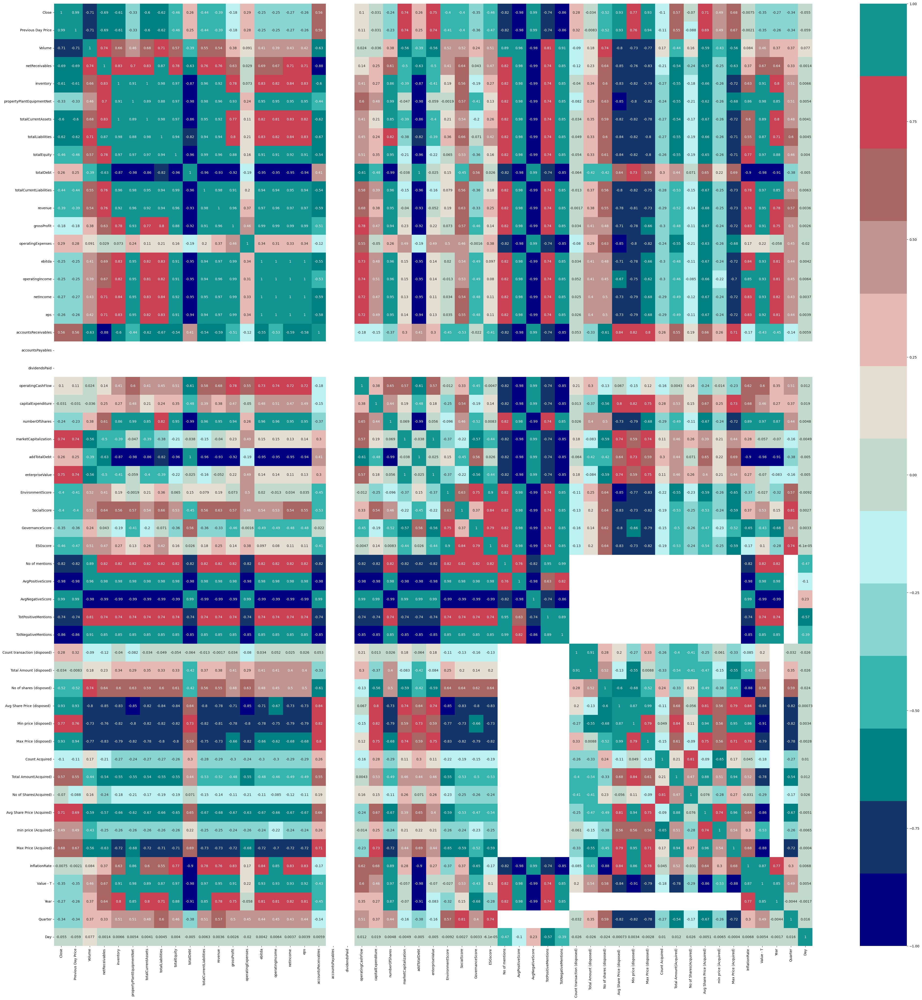

In [33]:
plt.figure(figsize=(50, 50))
sns.heatmap(newstocks_df.corr(), annot = True, vmin = -1, vmax = 1, cmap= custom_palette)
plt.show()

summary for multivariate analysis btw variables 

- fundamental data have a strong correlation between each other. 
- Capital expenditure shares a high negative correlation with most variables
- ESG Data has a positive correlation with count of shares transaction disposed and count acquired 
- Volume of shares sold has a strong postive correlation with Social sentiments data - No of mentions 
- Insider trading data - especially the count of disposed shares has a strong positive correlation with social sentiments data - No of mentions 
- negative social sentiment has a negative correlation relationship with GDP
-Inflation rate has a negative relationship with no of shares acquired 
- enterprise values and market capitalization has a good positive correlation with a lot of variables. 


### Other Analysis based on Select Stocks - TSLA 

one stock price analysis - case study Tesla 

Insider trader analysis vs Price

ESG Analysis of TESLA vs Price

Social Sentiment Analysis of TESLA VS PRICE 

Summary for one stock price analysis - case study Tesla 

### Feature selection for categorical using CHISQUARE TO CHECK ASSOCIATIOn (using Price change as categorical target and the categorical predictors)

We ndefine the null hypothesis and alternate hypothesis. 

H₀ (Null Hypothesis) — that the 2 categorical variables to be compared are independent of each other.
H₁ (Alternate Hypothesis) — that the 2 categorical variables being compared are dependent on each other.

And we draw conclusions based on the following p-value conditions:

p < 0.05 — this means the two categorical variables are correlated.
p > 0.05 — this means the two categorical variables are not correlated.


In [34]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['Industry'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 1.0


In [35]:


from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['Industry'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 1.0


In [36]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['Sector'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 1.0


In [37]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['IsCovidYear'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 1.0


In [38]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['Day of Week'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 0.4722462259954081


In [39]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['Market Capitalization'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 1.0


In [40]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['Ticker'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 1.0


#### Summary result for CHISQUARE TEST OF INDEPENDENCE 
- day of week has a pvalue greater than 0.05, however we accept the null hypothesis, that there is no association between price change and day of week.
- Most of the categorical predictors had chisquare less than 0.05, however we reject the null hypothesis; we agree that theres a relationship with all the other categorical columns and price change.



### ANOVA TEST - Feature Selection methods for (Categorical Predictors and numerical target)

The ANOVA test is used to measure the strength of the correlation between variables in both cases. ANOVA is an abbreviation for Analysis Of Variance and determines if there are significant differences between the means of numeric variables for each categorical value. A box plot is also a visual representation of this data.

Null hypothesis(H0) ANOVA hypothesis test: The variables are not correlated with each other

In [41]:
# Generating sample data
import pandas as pd

########################################################
# f_oneway() function takes the group data as input and
# returns F-statistic and P-value
from scipy.stats import f_oneway
 
# Running the one-way anova test between CarPrice and FuelTypes
# Assumption(H0) is that FuelType and CarPrices are NOT correlated
 
# Finds out the Prices data for each FuelType as a list
CategoryGroupLists=newstocks_df.groupby('Year')['Close'].apply(list)
 
# Performing the ANOVA test
# We accept the Assumption(H0) only when P-Value &gt; 0.05
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova is: ', AnovaResults[1])

P-Value for Anova is:  5.919530899066025e-10


In [42]:
# Generating sample data
import pandas as pd

########################################################
# f_oneway() function takes the group data as input and
# returns F-statistic and P-value
from scipy.stats import f_oneway
 
# Running the one-way anova test between CarPrice and FuelTypes
# Assumption(H0) is that FuelType and CarPrices are NOT correlated
 
# Finds out the Prices data for each FuelType as a list
CategoryGroupLists=newstocks_df.groupby('Month')['Close'].apply(list)
 
# Performing the ANOVA test
# We accept the Assumption(H0) only when P-Value &gt; 0.05
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova is: ', AnovaResults[1])

P-Value for Anova is:  3.8363747029170957e-17


#### Summary of Anova Test 

- Based on Anova test variables like IsCovidYear, Day of week, Year showed no association or correlation as their PValue was higher than 0.05, however we accept the null hypothesis. 

- all the other categorical predictors had pvalue score less than 0.05, hence we reject the null hypothesis. theres a relationship between close price and the other predictors - sector, industry, tickers, market capitalization, month


In [43]:
newstocks_df.isnull().sum()

Close                             0
Previous Day Price                0
Price Change                      0
Volume                            0
Ticker                            0
Market Capitalization             0
Industry                          0
Sector                            0
netReceivables                    0
inventory                         0
propertyPlantEquipmentNet         0
totalCurrentAssets                0
totalLiabilities                  0
totalEquity                       0
totalDebt                         0
totalCurrentLiabilities           0
revenue                           0
grossProfit                       0
operatingExpenses                 0
ebitda                            0
operatingIncome                   0
netIncome                         0
eps                               0
accountsReceivables               0
accountsPayables                  0
dividendsPaid                     0
operatingCashFlow                 0
capitalExpenditure          

In [44]:
newstocks_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 503 entries, 53279 to 53781
Data columns (total 62 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Close                         503 non-null    float64       
 1   Previous Day Price            503 non-null    float64       
 2   Price Change                  503 non-null    object        
 3   Volume                        503 non-null    int64         
 4   Ticker                        503 non-null    object        
 5   Market Capitalization         503 non-null    object        
 6   Industry                      503 non-null    object        
 7   Sector                        503 non-null    object        
 8   netReceivables                503 non-null    float64       
 9   inventory                     503 non-null    float64       
 10  propertyPlantEquipmentNet     503 non-null    float64       
 11  totalCurrentAssets        

In [45]:
newstocks_df.isnull().sum()

Close                             0
Previous Day Price                0
Price Change                      0
Volume                            0
Ticker                            0
Market Capitalization             0
Industry                          0
Sector                            0
netReceivables                    0
inventory                         0
propertyPlantEquipmentNet         0
totalCurrentAssets                0
totalLiabilities                  0
totalEquity                       0
totalDebt                         0
totalCurrentLiabilities           0
revenue                           0
grossProfit                       0
operatingExpenses                 0
ebitda                            0
operatingIncome                   0
netIncome                         0
eps                               0
accountsReceivables               0
accountsPayables                  0
dividendsPaid                     0
operatingCashFlow                 0
capitalExpenditure          

In [46]:
newstocks_df.isnull().sum()

Close                             0
Previous Day Price                0
Price Change                      0
Volume                            0
Ticker                            0
Market Capitalization             0
Industry                          0
Sector                            0
netReceivables                    0
inventory                         0
propertyPlantEquipmentNet         0
totalCurrentAssets                0
totalLiabilities                  0
totalEquity                       0
totalDebt                         0
totalCurrentLiabilities           0
revenue                           0
grossProfit                       0
operatingExpenses                 0
ebitda                            0
operatingIncome                   0
netIncome                         0
eps                               0
accountsReceivables               0
accountsPayables                  0
dividendsPaid                     0
operatingCashFlow                 0
capitalExpenditure          

### Statistical Analysis for Numerical Variables

newstocks_df.describe()

### Treating Missing Values with Imputation

#### Insights from this for numerical variable  - Take screenshot 


KNN was used because it is the most appropriate algorithm for this type of imputation. for fundamentals, picking the nearest neighbor for missing data would work better than using its mean or median or just deleting the figures. 

We must need business knowledge or common insights about the data. Due to domain knowledge we went for KNN Imputations. 

- Price information is right as the lowest is 0.06 for 'Ticker' and highest price is 'ticker' which traded at 539,180 at the said date.

- Fundamental information had missing values and KNN imputation was used to impute this records. 

- For ESG data, based on domain knowledge, KNN was better for this imputation than using median, or mean because it gives the performance per period so the missing details would be closer to their nearest neighbors.

- For Sentiments data, which had the highest number of missing information; having just 2 years data, 2021 and 2022; this dataset would be removed from the analysis and another analysis would be done to narrow on just those two years. Imputation would not be the best line of action due to high volatility of news. 

- For insider trading information, KNN was used to impute this. 





### We have broken the samples into the below datasets

All Imputed Data 

df_imputed - imputed all, did not treat outliers, log transform, scaled, dummies

Imputed Data - without tweet data - df_impute_drop

Imputed Data - leaving some data as 0  - df_imputed_some


2 years Data - df_sentiments


Fundamental Only - df_fundamentals


df_numerical_imputed_trainset - Imputed both missing values and outliers, log transformation and scaled.



#### write comments about this table 

### Imputation of missing values with KNN

In [47]:
newstocks_df2 = newstocks_df.copy()

In [48]:

# Assuming your DataFrame is named 'df' and your list of columns is named 'columns_list'
columns_list = ["accountsPayables","dividendsPaid","Previous Day Price","Price Change","Ticker","Market Capitalization","Industry","Sector","IsCovidYear"]
newstocks_df3 = newstocks_df2.drop(columns = columns_list)


In [49]:
newstocks_df3

,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Date,Year,Quarter,Month,Day,Day of Week
53279,123.18,157777339,2952000000.00,12839000000.00,36635000000.00,40917000000.00,36440000000.00,44704000000.00,5748000000.00,26709000000.00,24318000000.00,5777000000.00,1842000000.00,5012000000.00,3935000000.00,3714000000.00,1.18,-698000000.00,3278000000.00,-1858000000.00,3160000000.00,389248800000.00,5748000000.00,378743800000.00,73.31,59.18,67.30,66.59,11191.00,0.94,-0.96,3398.00,6780.00,48.00,3585265058.00,46163354.00,115.86,0.00,189.50,10.00,714671.00,65033.00,13.12,0.00,20.91,6.45,26.09,2022-12-30,2022,4,December,30,Friday
53280,121.82,221923313,2952000000.00,12839000000.00,36635000000.00,40917000000.00,36440000000.00,44704000000.00,5748000000.00,26709000000.00,24318000000.00,5777000000.00,1842000000.00,5012000000.00,3935000000.00,3714000000.00,1.18,-698000000.00,3278000000.00,-1858000000.00,3160000000.00,389248800000.00,5748000000.00,378743800000.00,73.31,59.18,67.30,66.59,19084.00,0.95,-0.97,5034.00,12392.00,48.00,3585265058.00,46163354.00,115.86,0.00,189.50,10.00,714671.00,65033.00,13.12,0.00,20.91,6.45,26.09,2022-12-29,2022,4,December,29,Thursday
53281,112.71,221070537,2952000000.00,12839000000.00,36635000000.00,40917000000.00,36440000000.00,44704000000.00,5748000000.00,26709000000.00,24318000000.00,5777000000.00,1842000000.00,5012000000.00,3935000000.00,3714000000.00,1.18,-698000000.00,3278000000.00,-1858000000.00,3160000000.00,389248800000.00,5748000000.00,378743800000.00,73.31,59.18,67.30,66.59,33790.00,0.94,-0.97,7048.00,24430.00,48.00,3585265058.00,46163354.00,115.86,0.00,189.50,10.00,714671.00,65033.00,13.12,0.00,20.91,6.45,26.09,2022-12-28,2022,4,December,28,Wednesday
53282,109.10,208643444,2952000000.00,12839000000.00,36635000000.00,40917000000.00,36440000000.00,44704000000.00,5748000000.00,26709000000.00,24318000000.00,5777000000.00,1842000000.00,5012000000.00,3935000000.00,3714000000.00,1.18,-698000000.00,3278000000.00,-1858000000.00,3160000000.00,389248800000.00,5748000000.00,378743800000.00,73.31,59.18,67.30,66.59,24569.00,0.93,-0.96,5780.00,17195.00,48.00,3585265058.00,46163354.00,115.86,0.00,189.50,10.00,714671.00,65033.00,13.12,0.00,20.91,6.45,26.09,2022-12-27,2022,4,December,27,Tuesday
53283,123.15,166989688,2952000000.00,12839000000.00,36635000000.00,40917000000.00,36440000000.00,44704000000.00,5748000000.00,26709000000.00,24318000000.00,5777000000.00,1842000000.00,5012000000.00,3935000000.00,3714000000.00,1.18,-698000000.00,3278000000.00,-1858000000.00,3160000000.00,389248800000.00,5748000000.00,378743800000.00,73.31,59.18,67.30,66.59,NaN,NaN,NaN,NaN,NaN,48.00,3585265058.00,46163354.00,115.86,0.00,189.50,10.00,714671.00,65033.00,13.12,0.00,20.91,6.45,26.09,2022-12-23,2022,4,December,23,Friday
53284,125.35,210090250,2952000000.00,12839000000.00,36635000000.00,40917000000.00,36440000000.00,44704000000.00,5748000000.00,26709000000.00,24318000000.00,5777000000.00,1842000000.00,5012000000.00,3935000000.00,3714000000.00,1.18,-698000000.00,3278000000.00,-1858000000.00,3160000000.00,389248800000.00,5748000000.00,378743800000.00,73.31,59.18,67.30,66.59,NaN,NaN,NaN,NaN,NaN,48.00,3585265058.00,46163354.00,115.86,0.00,189.50,10.00,714671.00,65033.00,13.12,0.00,20.91,6.45,26.09,2022-12-22,2022,4,Decem

In [51]:
!pip install category_encoders

import pandas as pd
import category_encoders as ce


# Assuming you have a DataFrame named 'df' with categorical columns 'cat_col1' and 'cat_col2'

df = newstocks_df3


# Target Encoding
target_encoder = ce.TargetEncoder(cols=['Month', 'Day of Week'])
df_target_encoded = target_encoder.fit_transform(df, df['Close'])


print("\nTarget Encoding:")
print(df_target_encoded)


Streaming output truncated to the last 5000 lines.
53327  5748000000.00  378743800000.00             73.31        59.18   
53328  5748000000.00  378743800000.00             73.31        59.18   
53329  5748000000.00  378743800000.00             73.31        59.18   
53330  5748000000.00  378743800000.00             73.31        59.18   
53331  5748000000.00  378743800000.00             73.31        59.18   
53332  5748000000.00  378743800000.00             73.31        59.18   
53333  5748000000.00  378743800000.00             73.31        59.18   
53334  5748000000.00  378743800000.00             73.31        59.18   
53335  5748000000.00  378743800000.00             73.31        59.18   
53336  5748000000.00  378743800000.00             73.31        59.18   
53337  5748000000.00  378743800000.00             73.31        59.18   
53338  5748000000.00  378743800000.00             73.31        59.18   
53339  5748000000.00  378743800000.00             73.31        59.18   
53340  574800

In [52]:
df_target_encoded['Date'] = pd.to_numeric(pd.to_datetime(df_target_encoded['Date'])) 

In [53]:
import pandas as pd
from sklearn.impute import KNNImputer

# Create the KNNImputer object
imputer = KNNImputer(n_neighbors=5)

# Perform KNN imputation on df_imputed
imputed_data = imputer.fit_transform(df_target_encoded)

# Convert the imputed data back to a DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df_target_encoded.columns)


In [54]:
imputed_df.corr()

,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Date,Year,Quarter,Month,Day,Day of Week
Close,1.00,-0.71,-0.69,-0.61,-0.33,-0.60,-0.62,-0.46,0.26,-0.44,-0.39,-0.18,0.29,-0.25,-0.25,-0.27,-0.26,0.56,0.10,-0.03,-0.24,0.74,0.26,0.75,-0.40,-0.40,-0.35,-0.46,-0.66,-0.66,0.66,-0.65,-0.66,0.12,-0.33,-0.55,0.83,0.76,0.83,-0.28,0.61,-0.09,0.74,0.67,0.72,-0.01,-0.35,-0.42,-0.27,-0.34,0.43,-0.06,0.03
Volume,-0.71,1.00,0.74,0.66,0.46,0.68,0.71,0.57,-0.39,0.55,0.54,0.38,0.09,0.41,0.39,0.43,0.42,-0.63,0.02,-0.04,0.38,-0.56,-0.39,-0.56,0.52,0.52,0.24,0.51,0.63,0.62,-0.62,0.64,0.63,-0.02,0.40,0.76,-0.83,-0.78,-0.81,0.32,-0.57,0.17,-0.71,-0.63,-0.69,0.08,0.46,0.52,0.37,0.37,-0.29,0.08,-0.00
netReceivables,-0.69,0.74,1.00,0.83,0.70,0.83,0.87,0.78,-0.63,0.76,0.76,0.63,0.03,0.69,0.67,0.71,0.71,-0.88,0.14,0.25,0.61,-0.50,-0.63,-0.50,0.41,0.64,0.04,0.47,0.68,0.68,-0.68,0.67,0.68,-0.02,0.44,0.67,-0.84,-0.80,-0.83,0.08,-0.63,-0.12,-0.71,-0.59,-0.73,0.37,0.67,0.71,0.64,0.33,-0.23,-0.00,-0.00
inventory,-0.61,0.66,0.83,1.00,0.91,1.00,0.98,0.97,-0.87,0.96,0.92,0.78,0.07,0.83,0.82,0.84,0.83,-0.60,0.41,0.27,0.86,-0.39,-0.87,-0.41,0.19,0.56,-0.19,0.27,0.88,0.89,-0.89,0.86,0.88,0.07,0.56,0.59,-0.81,-0.83,-0.79,0.23,-0.63,0.01,-0.83,-0.77,-0.79,0.63,0.91,0.94,0.80,0.51,-0.39,0.01,-0.01
propertyPlantEquipmentNet,-0.33,0.46,0.70,0.91,1.00,0.89,0.88,0.97,-0.98,0.98,0.96,0.93,0.24,0.95,0.95,0.95,0.95,-0.44,0.60,0.48,0.99,-0.05,-0.98,-0.06,-0.00,0.57,-0.41,0.13,0.69,0.70,-0.70,0.68,0.69,0.06,0.43,0.44,-0.61,-0.62,-0.60,0.23,-0.47,0.02,-0.65,-0.63,-0.60,0.86,0.98,0.98,0.85,0.51,-0.39,0.01,-0.01
totalCurrentAssets,-0.60,0.68,0.83,1.00,0.89,1.00,0.98,0.97,-0.86,0.95,0.92,0.77,0.11,0.82,0.81,0.83,0.82,-0.62,0.41,0.21,0.85,-0.39,-0.86,-0.40,0.21,0.54,-0.20,0.26,0.88,0.89,-0.89,0.87,0.88,0.07,0.56,0.59,-0.81,-0.83,-0.80,0.22,-0.63,0.01,-0.84,-0.77,-0.80,0.60,0.89,0.93,0.80,0.48,-0.36,0.00,-0.01
totalLiabilities,-0.62,0.71,0.87,0.98,0.88,0.98,1.00,0.94,-0.82,0.94,0.94,0.80,0.21,0.83,0.82,0.84,0.83,-0.67,0.45,0.24,0.82,-0.38,-0.82,-0.39,0.36,0.66,-0.07,0.42,0.86,0.87,-0.87,0.85,0.87,0.06,0.56,0.63,-0.85,-0.86,-0.84,0.17,-0.66,-0.03,-0.84,-0.73,-0.82,0.55,0.87,0.90,0.71,0.60,-0.44,0.00,-0.01
totalEquity,-0.46,0.57,0.78,0.97,0.97,0.97,0.94,1.00,-0.96,0.99,0.96,0.88,0.16,0.91,0.91,0.92,0.91,-0.54,0.51,0.35,0.95,-0.21,-0.96,-0.22,0.06,0.53,-0.36,0.16,0.80,0.80,-0.80,0.78,0.80,0.07,0.50,0.51,-0.71,-0.73,-0.70,0.24,-0.55,0.02,-0.75,-0.72,-0.70,0.77,0.97,0.99,0.88,0.46,-0.35,0.00,-0.01
totalDebt,0.26,-0.39,-0.63,-0.87,-0.98,-0.86,-0.82,-0.96,1.00,-0.96,-0.93,-0.92,-0.19,-0.95,-0.95,-0.95,-0.94,0.41,-0.61,-0.48,-0.99,-0.04,1.00,-0.02,0.15,-0.45,0.56,0.03,-0.66,-0.67,0.67,-0.65,-0.67,-0.08,-0.41,-0.36,0.52,0.56,0.52,-0.24,0.41,-0.06,0.60,0.61,0.54,-0.90,-0.98,-0.97,-0.91,-0.38,0.30,-0.01,0.01
totalCurrentLiabilities,-0.44,0.55,0.76,0.96,0.98,0.95,0.94,0.99,-0.96,1.00,0.98,0.91,0.20,0.94,0.94,0.95,0.94,-0.54,0.58,0.39,0.96,-0.15,-0.96,-0.16,0.08,0.56,-0.36,0.18,0.79,0.80,-0.80,0.78,0.80,0.08,0.50,0.50,-0.70,-0.73,-0.69,0.22,-0.55,0.02,-0.74,-0.70,-0.70,0.78,0.97,0.99,0.85,0.51,-0.39,0.01,-0.01


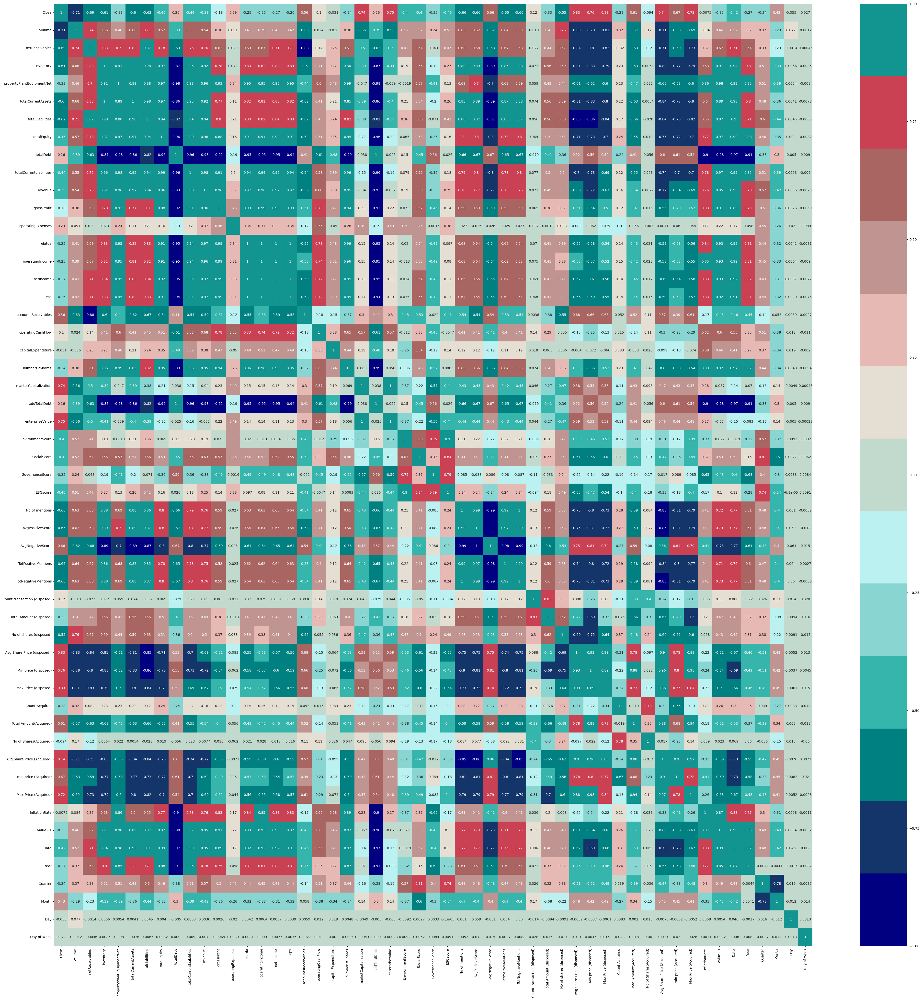

In [55]:
plt.figure(figsize=(50, 50))
sns.heatmap(imputed_df.corr(), annot = True, vmin = -1, vmax = 1, cmap= custom_palette)
plt.show()

In [56]:
imputed_df.describe()

,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Date,Year,Quarter,Month,Day,Day of Week
count,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00,503.00
mean,707.43,38919302.86,2178896620.28,7234071570.58,31247660039.76,29851266401.59,31076439363.82,32535934393.64,8483749502.98,20469457256.46,16937210735.59,4315471172.96,1767111332.01,3401622266.40,2548359840.95,2268795228.63,0.74,-156582504.97,3290510934.39,-1894491053.68,3044747514.91,773802592661.23,8483749502.98,764957441567.79,71.23,55.28,65.73,64.08,8710.18,0.81,-0.83,3005.39,3942.99,33.59,652676189.08,3133767.09,694.04,612.38,776.76,3.66,1557129.32,34284.17,49.07,41.46,54.28,6.37,24.40,1641021308946321920.00,2021.50,2.51,706.58,15.66,707.43
std,267.98,31023059.80,322234586.49,2837850324.63,3706974778.13,5568068516.51,2468021745.14,7111188252.34,2386147686.49,3761227979.00,4419876514.76,1208207792.72,205261352.04,1251392714.36,1128862742.49,1073564212.96,0.33,276883273.71,1142551852.84,372770781.04,98013912.08,221744444206.12,2386147686.49,221245609299.68,1.15,2.09,1.56,1.34,5693.01,0.06,0.06,820.73,5118.63,22.33,1714542097.16,9905721.95,219.72,223.15,242.03,2.52,676375.00,13027.12,16.78,18.85,17.51,2.12,1.26,18159973963525272.00,0.50,1.12,103.44,8.77,7.21
min,109.10,9800558.00,1890000000.00,4132000000.00,24844000000.00,24693000000.00,28507000000.00,23017000000.00,5748000000.00,14877000000.00,10389000000.00,2215000000.00,1549000000.00,1227000000.00,493000000.00,438000000.00,0.15,-698000000.00,1641000000.00,-2860000000.00,2883000000.00,389248800000.00,5748000000.00,378743800000.00,69.57,51.87,63.07,62.52,327.00,0.75,-0.97,139.00,66.00,2.00,3353850.00,14250.00,115.86,0.00,189.50,1.00,219555.00,10500.00,11.97,0.00,20.91,1.40,22.03,1609718400000000000.00,2021.00,1.00,539.91,1.00,695.42
25%,630.56,22031158.50,1962000000.00,5199000000.00,29248000000.00,25002000000.00,29340000000.00,27053000000.00,5874000000.00,18051000000.00,13757000000.00,3660000000.00,1605000000.00,2728000000.00,2055000000.00,1618000000.00,0.54,-259000000.00,2351000000.00,-1825000000.00,2994000000.00,659988797100.00,5874000000.00,654892797100.00,70.27,54.44,64.14,62.89,5263.80,0.77,-0.93,2516.40,832.80,32.00,28552428.00,33400.00,740.86,718.31,887.99,3.00,1667320.00,33500.00,42.60,20.91,62.72,5.37,23.32,1625356800000000000.00,2021.00,2.00,606.15,8.00,703.84
50%,730.91,28639305.00,2129000000.00,5757000000.00,31176000000.00,27100000000.00,30548000000.00,30189000000.00,8873000000.00,19705000000.00,17719000000.00,4847000000.00,1694000000.00,3532000000.00,2613000000.00,2321000000.00,0.76,-193000000.00,3278000000.00,-1814000000.00,3045000000.00,773928940200.00,8873000000.00,767989940200.00,71.07,54.53,66.42,64.16,5263.80,0.77,-0.80,2516.40,832.80,32.00,28552428.00,33400.00,795.79,722.10,887.99,3.00,1805620.00,33500.00,58.28,52.38,62.72,7.04,24.52,1640908800000000000.00,2021.00,3.00,694.60,16.00,710.34
75%,878.70,40565587.50,2192000000.00,10327000000.00,34563000000.00,35990000000.00,33

In [57]:
imputed_df.isnull().sum()

Close                           0
Volume                          0
netReceivables                  0
inventory                       0
propertyPlantEquipmentNet       0
totalCurrentAssets              0
totalLiabilities                0
totalEquity                     0
totalDebt                       0
totalCurrentLiabilities         0
revenue                         0
grossProfit                     0
operatingExpenses               0
ebitda                          0
operatingIncome                 0
netIncome                       0
eps                             0
accountsReceivables             0
operatingCashFlow               0
capitalExpenditure              0
numberOfShares                  0
marketCapitalization            0
addTotalDebt                    0
enterpriseValue                 0
EnvironmentScore                0
SocialScore                     0
GovernanceScore                 0
ESGscore                        0
No of mentions                  0
AvgPositiveSco

### Rerun Analysis 

Categorical Variables:
Index(['Price Change', 'Ticker', 'Market Capitalization', 'Industry', 'Sector',
       'IsCovidYear', 'Month', 'Day of Week'],
      dtype='object')
Numerical Variables:
['No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)', 'Count Acquired', 'Total Amount(Acquired)', 'No of Shares(Acquired)', 'Avg Share Price (Acquired)', 'min price (Acquired)', 'Max Price (Acquired)']


CREATING MORE MODELS 

### All Data 

All Imputed Data df_imputed, imputed all, did not treat outliers, log transform, scaled, dummies


Imputed Data - without tweet data - df_impute_drop

Imputed Data - leaving some data as 0  - df_imputed_some


2 years Data - df_sentiments


Fundamental Only - df_fundamentals


df_numerical_imputed_trainset - Imputed, outliers, log transformation and scaled.

newstocks_df_pure -  delete missing records- no imputation




rerun analysis 
feature engin\eering 

-label encoding
-scale normalize 
-PCA or select k best dimensionality reduction
-Baseline 
-SMOTE or NO SMOTE 
-Divide and model 


In [59]:
class OutlierHandler(TransformerMixin, BaseEstimator):

    """This class transforms all outliers into np.NaN that will be subsequently treated.
    Outliers < Q1-(1.5*IQR_Value) or > Q3+(1.5*IQR_Value)
    Note : the fit_transform method is inherited from the TransformerMixin super class
    """

    
    def __init__(self):
        self.fitted = False
        return None

    def fit(self, df):
        """
        Pre-condition: Unfitted DataFrame Object containing numerical outliers.
        Post-condition: Fitted DataFrame object with outliers transformed into null values.
        """
    # Outliers are selected for fields containing numerical variables only
        num_df = df.select_dtypes(include='float64')
        
    # Obtain values for Q1, Q3 and IQR ≡ Q3-Q1
        self.quantiles = pd.DataFrame(num_df.quantile([0.25, 0.75]))
        self.quantiles.loc['IQR',:] = self.quantiles.loc[0.75,:] - self.quantiles.loc[0.25,:]

    # Calculate upper and lower limits for outliers.
    # These bounds are calculated on the Train Dataset, then applied to the train and test datasets
        self.quantiles.loc['lower_limit',:] = self.quantiles.loc[0.25,:] - 1.5 * self.quantiles.loc['IQR',:]
        self.quantiles.loc['upper_limit',:] = self.quantiles.loc[0.75,:] + 1.5 * self.quantiles.loc['IQR',:]
    # Change fitting status
        self.fitted = True
        return self

    def transform(self, df):
        """
        Pre-condition: Fitted DataFrame object
        Post-condition: DataFrame object with outliers transformed into NaN.
        """
        if self.fitted == False:
            print('The transformer must be fitted before transformation.')
            return None
    # Make a copy of the dataframe object to prevent mutation.
        df_copy = df.copy()
    # Old number of NaNs to count number of outliers
        old_num_na = sum(df_copy.isnull().sum())
        for col in self.quantiles.columns:
    # Fill values < lower limit
            df_copy.loc[df_copy.loc[:,col] < self.quantiles.loc['lower_limit',col],col] = np.NaN
    # Fill values > upper limit
            df_copy.loc[df_copy.loc[:,col] > self.quantiles.loc['upper_limit',col],col] = np.NaN
    # Print Number of Outliers
        print(str(sum(df_copy.isna().sum()) - old_num_na) + ' Outliers are Identified.')
        return df_copy

In [60]:
#Identifying outliers
outlier_handler = OutlierHandler()
trainset = outlier_handler.fit_transform(imputed_df)

1768 Outliers are Identified.


In [61]:
trainset.corr()

,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Date,Year,Quarter,Month,Day,Day of Week
Close,1.00,-0.37,-0.08,-0.14,0.13,-0.12,-0.05,0.03,-0.10,0.04,0.14,0.25,0.41,0.18,0.15,0.17,0.18,0.03,0.15,0.09,0.14,0.51,-0.10,0.51,0.20,0.24,-0.12,0.13,-0.38,-0.38,0.38,-0.38,-0.38,NaN,NaN,NaN,0.10,0.17,NaN,NaN,0.17,NaN,0.11,0.46,-0.20,0.13,0.05,-0.00,0.01,0.05,0.29,-0.08,0.04
Volume,-0.37,1.00,0.12,0.39,0.18,0.43,0.41,0.30,-0.19,0.27,0.25,0.12,0.22,0.15,0.13,0.16,0.16,-0.31,0.05,-0.04,0.16,-0.24,-0.19,-0.25,0.08,0.04,-0.09,0.01,0.43,0.43,-0.43,0.42,0.43,NaN,NaN,NaN,-0.12,-0.11,NaN,NaN,-0.11,NaN,-0.35,-0.45,-0.03,0.05,0.23,0.26,0.25,0.01,-0.07,0.08,0.08
netReceivables,-0.08,0.12,1.00,0.55,0.56,0.54,0.50,0.60,-0.64,0.60,0.56,0.58,0.45,0.67,0.67,0.70,0.69,-0.75,0.33,0.36,0.56,0.32,-0.64,0.31,-0.71,0.01,-0.79,-0.60,0.34,0.34,-0.34,0.34,0.34,NaN,NaN,NaN,-0.09,-0.06,NaN,NaN,-0.06,NaN,-0.20,-0.25,-0.37,0.62,0.55,0.57,0.76,-0.35,0.24,0.01,-0.01
inventory,-0.14,0.39,0.55,1.00,0.91,1.00,0.98,0.97,-0.87,0.96,0.92,0.78,0.51,0.83,0.82,0.84,0.83,-0.60,0.41,-0.31,0.86,-0.39,-0.87,-0.41,0.19,0.56,-0.19,0.27,0.88,0.89,-0.89,0.87,0.88,NaN,NaN,NaN,-0.31,-0.43,NaN,NaN,-0.43,NaN,-0.80,-0.77,-0.95,0.63,0.91,0.94,0.80,0.51,-0.39,0.01,-0.01
propertyPlantEquipmentNet,0.13,0.18,0.56,0.91,1.00,0.89,0.88,0.97,-0.98,0.98,0.96,0.93,0.49,0.95,0.95,0.95,0.95,-0.44,0.60,-0.10,0.99,-0.05,-0.98,-0.06,-0.00,0.57,-0.41,0.13,0.69,0.70,-0.70,0.68,0.69,NaN,NaN,NaN,-0.24,-0.31,NaN,NaN,-0.31,NaN,-0.60,-0.63,-0.84,0.86,0.98,0.98,0.85,0.51,-0.39,0.01,-0.01
totalCurrentAssets,-0.12,0.43,0.54,1.00,0.89,1.00,0.98,0.97,-0.86,0.95,0.92,0.77,0.56,0.82,0.81,0.83,0.82,-0.62,0.41,-0.31,0.85,-0.39,-0.86,-0.40,0.21,0.54,-0.20,0.26,0.88,0.89,-0.89,0.87,0.88,NaN,NaN,NaN,-0.30,-0.42,NaN,NaN,-0.42,NaN,-0.81,-0.77,-0.94,0.60,0.89,0.93,0.80,0.48,-0.36,0.00,-0.01
totalLiabilities,-0.05,0.41,0.50,0.98,0.88,0.98,1.00,0.94,-0.82,0.94,0.94,0.80,0.57,0.83,0.82,0.84,0.83,-0.67,0.45,-0.50,0.82,-0.38,-0.82,-0.39,0.36,0.66,-0.07,0.42,0.86,0.87,-0.87,0.85,0.87,NaN,NaN,NaN,-0.25,-0.28,NaN,NaN,-0.28,NaN,-0.82,-0.73,-0.80,0.55,0.87,0.90,0.71,0.60,-0.44,0.00,-0.01
totalEquity,0.03,0.30,0.60,0.97,0.97,0.97,0.94,1.00,-0.96,0.99,0.96,0.88,0.55,0.91,0.91,0.92,0.91,-0.54,0.51,-0.16,0.95,-0.21,-0.96,-0.22,0.06,0.53,-0.36,0.16,0.80,0.80,-0.80,0.79,0.80,NaN,NaN,NaN,-0.28,-0.36,NaN,NaN,-0.36,NaN,-0.70,-0.72,-0.90,0.77,0.97,0.99,0.88,0.46,-0.35,0.00,-0.01
totalDebt,-0.10,-0.19,-0.64,-0.87,-0.98,-0.86,-0.82,-0.96,1.00,-0.96,-0.93,-0.92,-0.49,-0.95,-0.95,-0.95,-0.94,0.41,-0.61,-0.12,-0.99,-0.04,1.00,-0.02,0.15,-0.45,0.56,0.03,-0.66,-0.67,0.67,-0.66,-0.67,NaN,NaN,NaN,0.25,0.32,NaN,NaN,0.32,NaN,0.54,0.61,0.86,-0.90,-0.98,-0.97,-0.91,-0.38,0.30,-0.01,0.01
totalCurrentLiabilities,0.04,0.27,0.60,0.96,0.98,0.95,0.94,0.99,-0.96,1.00,0.98,0.91,0.54,0.94,0.94,0.95,0.94,-0.54,0.58,-0.25,0.96,-0.15,-0.96,-0.16,0.08,0.56,-0.36,0.18,0.79,0.80,-0.80,0.79,0.80,NaN,NaN,NaN,-0.25,-0.30,NaN,NaN,-0.30,NaN,-0.69,-0.70,-0.84,0.78,0.97,0.99,0.85,0.51,-0.39,0.01,-0.01


In [62]:
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer

# create sample dataframe with missing values and categorical columns
df = pd.DataFrame(trainset)

# select only the numerical columns
df_numerical = df.select_dtypes(include=np.number)

# replace zeros with NaN
df_numerical = df_numerical.replace(0, np.nan)

# instantiate KNN imputer with k=3
imputer = KNNImputer(n_neighbors=3)

# impute missing and zero values in the numerical columns
df_numerical_imputed_trainset = pd.DataFrame(imputer.fit_transform(df_numerical), columns=df_numerical.columns)

# replace NaN back to zeros
df_numerical_imputed_trainset = df_numerical_imputed_trainset.replace(np.nan, 0)

# combine the imputed numerical columns with the original categorical columns
df_numerical_imputed_trainset = pd.concat([df.select_dtypes(exclude=np.number), df_numerical_imputed_trainset], axis=1)

# display the resulting dataframe
print(df_numerical_imputed_trainset)


      Close      Volume  netReceivables      inventory  \
0    273.76 60525436.00   2192000000.00 12839000000.00   
1    273.76 60525436.00   2192000000.00 12839000000.00   
2    273.76 60525436.00   2192000000.00 12839000000.00   
3    273.76 60525436.00   2192000000.00 12839000000.00   
4    273.76 60525436.00   2192000000.00 12839000000.00   
5    273.76 60525436.00   2192000000.00 12839000000.00   
6    273.76 60525436.00   2192000000.00 12839000000.00   
7    273.76 60525436.00   2192000000.00 12839000000.00   
8    273.76 60525436.00   2192000000.00 12839000000.00   
9    273.76 60525436.00   2192000000.00 12839000000.00   
10   273.76 60525436.00   2192000000.00 12839000000.00   
11   273.76 60525436.00   2192000000.00 12839000000.00   
12   273.76 60525436.00   2192000000.00 12839000000.00   
13   273.76 60525436.00   2192000000.00 12839000000.00   
14   273.76 60525436.00   2192000000.00 12839000000.00   
15   273.76 60525436.00   2192000000.00 12839000000.00   
16   273.76 60

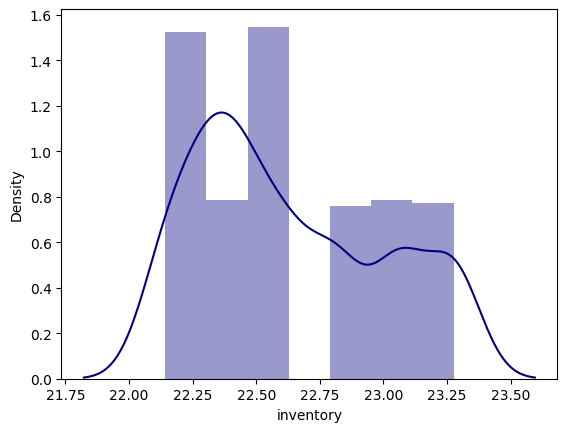

In [63]:
# Function for log and cube root transformation of the column
def log_cube_transform(data, col):
    for colname in col:
        # Log transform positive values
        data[colname][data[colname] > 0] = np.log(data[colname][data[colname] > 0] + 1e-10)
        # Cube root transform negative values
        data[colname][data[colname] < 0] = -1 * np.power(-1 * data[colname][data[colname] < 0], 1/3)
    
log_cube_transform(df_numerical_imputed_trainset, ['Close', 'Volume', 'netReceivables', 'inventory', 'propertyPlantEquipmentNet', 'totalCurrentAssets', 'totalLiabilities', 'totalEquity', 'totalDebt', 'totalCurrentLiabilities', 'revenue', 'grossProfit', 'operatingExpenses', 'ebitda', 'operatingIncome', 'netIncome', 'eps', 'accountsReceivables', 'operatingCashFlow', 'capitalExpenditure', 'numberOfShares', 'marketCapitalization', 'addTotalDebt', 'enterpriseValue', 'EnvironmentScore', 'SocialScore', 'GovernanceScore', 'ESGscore', 'No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)', 'Count Acquired', 'Total Amount(Acquired)', 'No of Shares(Acquired)', 'Avg Share Price (Acquired)', 'min price (Acquired)', 'Max Price (Acquired)', 'InflationRate', 'Value - T', 'Year', 'Quarter', 'Day'])

# Plot the transformed feature 'inventory'
sns.distplot(df_numerical_imputed_trainset["inventory"], axlabel="inventory");


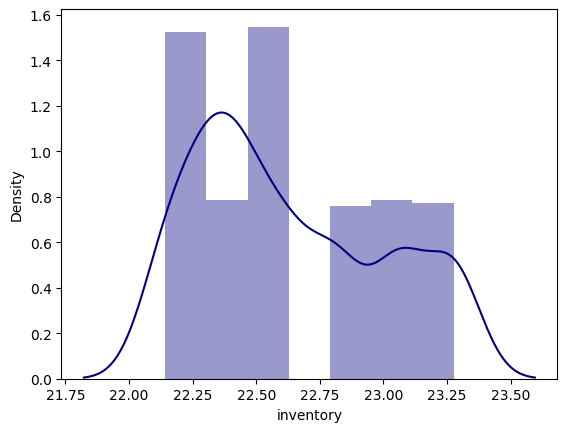

In [64]:
# Function for log and cube root transformation of the column
def log_cube_transform(data, col):
    for colname in col:
        # Log transform positive values
        data[colname][data[colname] > 0] = np.log(data[colname][data[colname] > 0] + 1e-10)
        # Cube root transform negative values
        data[colname][data[colname] < 0] = -1 * np.power(-1 * data[colname][data[colname] < 0], 1/3)
    
log_cube_transform(imputed_df, ['Close', 'Volume', 'netReceivables', 'inventory', 'propertyPlantEquipmentNet', 'totalCurrentAssets', 'totalLiabilities', 'totalEquity', 'totalDebt', 'totalCurrentLiabilities', 'revenue', 'grossProfit', 'operatingExpenses', 'ebitda', 'operatingIncome', 'netIncome', 'eps', 'accountsReceivables', 'operatingCashFlow', 'capitalExpenditure', 'numberOfShares', 'marketCapitalization', 'addTotalDebt', 'enterpriseValue', 'EnvironmentScore', 'SocialScore', 'GovernanceScore', 'ESGscore', 'No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)', 'Count Acquired', 'Total Amount(Acquired)', 'No of Shares(Acquired)', 'Avg Share Price (Acquired)', 'min price (Acquired)', 'Max Price (Acquired)', 'InflationRate', 'Value - T', 'Year', 'Quarter', 'Day'])

# Plot the transformed feature 'inventory'
sns.distplot(imputed_df["inventory"], axlabel="inventory");


In [ ]:
df_imputed.describe()

In [68]:
df_numerical_imputed_trainset.isnull().sum()

Close                           0
Volume                          0
netReceivables                  0
inventory                       0
propertyPlantEquipmentNet       0
totalCurrentAssets              0
totalLiabilities                0
totalEquity                     0
totalDebt                       0
totalCurrentLiabilities         0
revenue                         0
grossProfit                     0
operatingExpenses               0
ebitda                          0
operatingIncome                 0
netIncome                       0
eps                             0
accountsReceivables             0
operatingCashFlow               0
capitalExpenditure              0
numberOfShares                  0
marketCapitalization            0
addTotalDebt                    0
enterpriseValue                 0
EnvironmentScore                0
SocialScore                     0
GovernanceScore                 0
ESGscore                        0
No of mentions                  0
AvgPositiveSco

creating dummies with label encoder 

## Trainings and predictions Using Date based splits

In [ ]:
data = df_numerical_imputed_trainset.copy()

#data["Close"]
data['Date'] = pd.to_datetime(data['Date'])

In [69]:
data = imputed_df.copy()

#data["Close"]
data['Date'] = pd.to_datetime(data['Date'])

### Trying different encoding techniques to see which gives better results 

generated 3 tables

data_ohe
df_ordinal_encoded
df_target_encoded


In [70]:


from sklearn.model_selection import train_test_split
X = data.drop(columns=["Close"])
y = data["Close"]

# Sort the data by date
sorted_df = data.sort_values('Date')

# Define the date-based split criterion
train_end_date = '2022-06-30'
test_start_date = '2022-07-01'

# Split the data into train and test sets based on the date criterion
X_train = sorted_df[sorted_df['Date'] < train_end_date].drop(columns=["Close"])
X_test = sorted_df[sorted_df['Date'] >= test_start_date].drop(columns=["Close"])
y_train = sorted_df[sorted_df['Date'] < train_end_date]['Close']
y_test = sorted_df[sorted_df['Date'] >= test_start_date]['Close']


In [71]:
# split your data to training and test set 
X = data.drop(columns=["Close"])
y = data["Close"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=2)

In [72]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 202 entries, 499 to 35
Data columns (total 52 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Volume                        202 non-null    float64       
 1   netReceivables                202 non-null    float64       
 2   inventory                     202 non-null    float64       
 3   propertyPlantEquipmentNet     202 non-null    float64       
 4   totalCurrentAssets            202 non-null    float64       
 5   totalLiabilities              202 non-null    float64       
 6   totalEquity                   202 non-null    float64       
 7   totalDebt                     202 non-null    float64       
 8   totalCurrentLiabilities       202 non-null    float64       
 9   revenue                       202 non-null    float64       
 10  grossProfit                   202 non-null    float64       
 11  operatingExpenses             2

In [73]:
X_train['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 
X_test['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 


In [74]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 202 entries, 499 to 35
Data columns (total 52 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Volume                        202 non-null    float64
 1   netReceivables                202 non-null    float64
 2   inventory                     202 non-null    float64
 3   propertyPlantEquipmentNet     202 non-null    float64
 4   totalCurrentAssets            202 non-null    float64
 5   totalLiabilities              202 non-null    float64
 6   totalEquity                   202 non-null    float64
 7   totalDebt                     202 non-null    float64
 8   totalCurrentLiabilities       202 non-null    float64
 9   revenue                       202 non-null    float64
 10  grossProfit                   202 non-null    float64
 11  operatingExpenses             202 non-null    float64
 12  ebitda                        202 non-null    float64
 13  oper

Model 1  - df_numerical_imputed_trainset dropping multicollinearity;no dimension reduction
data['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 

Dimensionality Reduction 

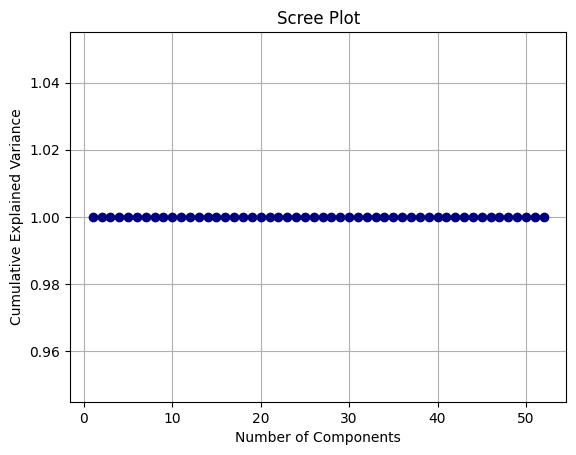

In [75]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming 'data' is your input data

# Perform PCA
pca = PCA()
pca.fit(X_train)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot the scree plot
plt.plot(np.arange(1, len(explained_variance_ratio) + 1), np.cumsum(explained_variance_ratio), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.grid(True)
plt.show()


If your screeplot appears as a straight line, it suggests that all the principal components are explaining an equal amount of variance in the data. This can happen when the dataset doesn't exhibit clear dominant patterns or when the variables have a high degree of multicollinearity.

In such cases, it becomes more challenging to determine the optimal number of principal components to retain. One approach is to consider retaining a subset of the principal components that capture a significant amount of variance, such as those above a certain threshold (e.g., components with eigenvalues greater than 1).

However, it's important to note that PCA may not be the most suitable technique for dimensionality reduction in cases where the screeplot is a straight line. In such situations, you could explore other dimensionality reduction techniques, such as feature selection methods or nonlinear dimensionality reduction methods like t-SNE or UMAP, which may better capture the underlying structure of the data.

In [76]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest classifier
rf_regressor = RandomForestRegressor()

# Fit the model to the training data
rf_regressor.fit(X_train, y_train)

# Get feature importances
importances = rf_regressor.feature_importances_

# Create a DataFrame to store feature importances
feature_importances = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the DataFrame by importance values in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Print the feature importances
print(feature_importances)


                         Feature  Importance
46                          Date        0.90
11             operatingExpenses        0.02
22               enterpriseValue        0.02
20          marketCapitalization        0.01
49                         Month        0.01
35   Avg Share Price (disposed)         0.01
36          Min price (disposed)        0.01
0                         Volume        0.01
50                           Day        0.00
9                        revenue        0.00
26                      ESGscore        0.00
34       No of shares (disposed)        0.00
45                     Value - T        0.00
17             operatingCashFlow        0.00
44                 InflationRate        0.00
13               operatingIncome        0.00
37          Max Price (disposed)        0.00
25               GovernanceScore        0.00
14                     netIncome        0.00
10                   grossProfit        0.00
12                        ebitda        0.00
51        

In [77]:
#PCA

from sklearn.decomposition import PCA

# Create PCA object with desired number of components
n_components = 1  # Choose the number of principal components
pca = PCA(n_components=n_components)

# Fit PCA on the one-hot encoded training data
pca.fit(X_train)

# Transform the training data to its principal components
X_train_pca = pca.transform(X_train)

# Print the explained variance ratio of each principal component
print("Explained Variance Ratio:")
for i in range(n_components):
    print("PC{}: {:.2f}%".format(i+1, pca.explained_variance_ratio_[i] * 100))

# Print the shape of the transformed data
print("Shape of X_train_pca:", X_train_pca.shape)


Explained Variance Ratio:
PC1: 100.00%
Shape of X_train_pca: (301, 1)


In [78]:
from sklearn.decomposition import PCA

# Perform PCA with 50 components
pca = PCA(n_components=25)
X_pca = pca.fit_transform(X_train)

# Retrieve the loadings
loadings = pca.components_

# Associate loadings with feature names
feature_names = X_train.columns  # Assuming X is a DataFrame
loadings_with_names = pd.DataFrame(loadings.T, columns=[f'PC{i+1}' for i in range(25)], index=feature_names)


In [79]:
loadings_with_names

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25
Volume,-0.00,-0.00,-0.00,0.01,-0.00,0.08,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00
netReceivables,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.76,-0.65,-0.00
inventory,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.04,0.02,0.01,0.02,0.04,-0.01,0.07,-0.27,-0.16,-0.17,0.02,0.27,-0.01,-0.00,0.00,0.00,0.29,0.35,-0.06
propertyPlantEquipmentNet,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.01,-0.01,-0.00,0.01,-0.00,0.01,-0.00,-0.07,-0.06,-0.01,0.04,0.08,-0.00,-0.00,0.00,0.00,-0.53,-0.63,-0.14
totalCurrentAssets,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.03,-0.03,0.03,0.06,-0.01,-0.02,0.05,-0.14,-0.09,-0.11,0.01,0.16,-0.00,0.00,0.00,0.00,-0.23,-0.23,0.19
totalLiabilities,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.02,-0.02,0.02,0.03,-0.00,0.01,0.01,-0.02,-0.04,-0.02,0.01,0.04,-0.00,0.00,-0.00,0.00,-0.01,-0.01,-0.41
totalEquity,-0.00,-0.00,0.00,-0.00,-0.00,-0.01,0.02,-0.02,0.01,0.04,-0.01,-0.01,0.03,-0.17,-0.12,-0.08,0.05,0.18,-0.00,-0.00,0.00,0.00,-0.03,-0.05,0.28
totalDebt,0.00,0.00,-0.00,0.00,0.00,0.01,0.01,-0.00,0.00,-0.03,0.00,0.02,-0.03,0.25,0.12,0.14,-0.06,-0.25,0.00,0.00,-0.00,-0.00,-0.01,-0.00,-0.01
totalCurrentLiabilities,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.01,-0.00,-0.00,0.02,0.01,0.02,-0.00,-0.11,-0.08,-0.04,0.03,0.11,-0.00,-0.00,0.00,0.00,-0.00,-0.01,0.18
revenue,-0.00,-0.00,-0.00,-0.00,-0.00,-0.01,0.04,-0.11,0.06,0.15,-0.06,0.05,-0.04,-0.10,-0.15,-0.06,0.07,0.16,-0.00,0.00,-0.00,0.00,0.01,0.01,-0.23


In [80]:
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd

# Step 1: Fit the PCA on the one-hot encoded training data
n_components = 50
pca = PCA(n_components=n_components)
pca.fit(X_train)

# Step 2: Get the explained variance ratio and cumulative explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Step 3: Get the original column headers
column_headers = X_train.columns

# Step 4: Transform the training data to its principal components
X_train_pca = pca.transform(X_train)

# Step 5: Create a DataFrame with the transformed data and corresponding column headers
column_headers_pca = [f"PC{i+1}" for i in range(n_components)]
X_train_pca_df = pd.DataFrame(X_train_pca, columns=column_headers_pca)

# Step 6: Map the principal components to the original column headers
component_mapping = pd.DataFrame(pca.components_.T, columns=column_headers_pca, index=column_headers)


In [81]:
component_mapping

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50
Volume,-0.00,-0.00,-0.00,0.01,-0.00,0.08,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00
netReceivables,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.76,-0.65,-0.00,0.02,-0.02,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00
inventory,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.04,0.02,0.01,0.02,0.04,-0.01,0.07,-0.27,-0.16,-0.17,0.02,0.27,-0.01,-0.00,0.00,0.00,0.29,0.35,-0.06,-0.36,-0.56,0.30,-0.17,-0.13,-0.01,0.05,-0.03,-0.01,-0.04,-0.02,-0.01,0.02,0.00,-0.00,-0.00,0.00,0.01,0.01,0.01,0.00,0.00,0.00,0.00,-0.00
propertyPlantEquipmentNet,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.01,-0.01,-0.00,0.01,-0.00,0.01,-0.00,-0.07,-0.06,-0.01,0.04,0.08,-0.00,-0.00,0.00,0.00,-0.53,-0.63,-0.14,-0.48,-0.15,0.12,-0.06,-0.06,-0.02,0.02,0.02,0.02,-0.03,0.00,0.01,0.02,0.01,-0.01,-0.01,0.03,0.00,-0.02,-0.00,-0.00,0.00,0.00,-0.00,-0.00
totalCurrentAssets,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.03,-0.03,0.03,0.06,-0.01,-0.02,0.05,-0.14,-0.09,-0.11,0.01,0.16,-0.00,0.00,0.00,0.00,-0.23,-0.23,0.19,0.74,-0.46,0.05,-0.08,-0.06,0.02,0.05,-0.05,-0.03,-0.01,-0.04,-0.02,-0.02,-0.00,-0.01,-0.01,-0.00,0.00,0.00,0.01,0.00,-0.00,0.00,0.00,-0.00
totalLiabilities,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.02,-0.02,0.02,0.03,-0.00,0.01,0.01,-0.02,-0.04,-0.02,0.01,0.04,-0.00,0.00,-0.00,0.00,-0.01,-0.01,-0.41,0.17,0.30,0.51,0.07,-0.23,0.31,0.26,-0.38,0.06,0.19,-0.00,-0.05,0.03,-0.06,-0.00,-0.03,-0.11,0.02,0.11,-0.05,0.06,-0.02,0.01,0.00,-0.00
totalEquity,-0.00,-0.00,0.00,-0.00,-0.00,-0.01,0.02,-0.02,0.01,0.04,-0.01,-0.01,0.03,-0.17,-0.12,-0.08,0.05,0.18,-0.00,-0.00,0.00,0.00,-0.03,-0.05,0.28,-0.06,0.24,0.11,-0.17,0.27,-0.03,-0.41,-0.26,-0.06,-0.02,-0.03,-0.06,-0.09,-0.06,0.13,0.17,-0.32,0.10,0.43,0.23,0.03,-0.08,0.02,0.04,-0.01
totalDebt,0.00,0.00,-0.00,0.00,0.00,0.01,0.01,-0.00,0.00,-0.03,0.00,0.02,-0.03,0.25,0.12,0.14,-0.06,-0.25,0.00,0.00,-0.00,-0.00,-0.01,-0.00,-0.01,0.04,-0.15,0.32,-0.19,0.12,-0.10,0.05,0.27,0.03,0.04,-0.02,-0.19,0.06,-0.06,-0.03,0.52,-0.24,0.25,0.08,-0.22,0.04,0.29,0.02,-0.02,0.03
totalCurrentLiabilities,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.01,-0.00,-0.00,0.02,0.01,0.02,-0.00,-0.11,-0.08,-0.04,0.03,0.11,-0.00,-0.00,0.00,0.00,-0.00,-0.01,0.18,-0.07,0.06,-0.19,0.15,-0.24,0.27,-0.26,-0.31,-0.11,-0.00,-0.04,-0.24,0.09,0.02,0.11,0.29,-0.01,0.00,-0.39,-0.27,-0.19,0.36,-0.01,-0.01,0.06
revenue,-0.00,-0.00,-0.00,-0.00,-0.00,-0.01,0.04,-0.11,0.06,0.15,-0.06,0.05,-0.04,-0.10,-0.15,-0.06,0.07,0.16,-0.00,0.00,-0.00,0.00,0.01,0.01,-0.23,0.07,0.13,0.02,-0.07,0.22,-0.12,-0.10,0.17,-0.26,0.21,-0.06,-0.18,0.13,-0.06,0.10,0.29,0.55,-0.28,0.08,-0.16,0.17,-0.10,0.03,-0.01,-0.04


In [82]:
# Initialize scaler

#data['Date'] = pd.to_numeric(pd.to_datetime(data['Date']))
scaler = MinMaxScaler()

#Fit scaler on training data and transform both train and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [83]:
X_train

,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Date,Year,Quarter,Month,Day,Day of Week
174,16.96,21.46,22.82,24.24,24.16,24.15,24.32,22.62,23.81,23.55,22.17,21.21,21.96,21.68,21.54,-0.68,18.99,21.58,-1200.46,21.86,27.27,22.62,27.26,4.24,4.00,4.16,4.14,8.57,-0.64,-0.93,7.83,6.72,3.47,17.17,10.42,6.68,6.58,6.79,1.10,14.41,10.42,4.07,3.96,4.14,2.11,3.22,1650585600000000000,7.61,0.69,834.44,3.09,695.42
286,17.57,21.37,22.47,24.16,24.02,24.14,24.13,22.91,23.70,23.60,22.30,21.53,21.99,21.68,21.57,-0.65,16.71,22.25,-1219.59,21.84,27.70,22.91,27.69,4.28,4.05,4.20,4.18,8.57,-0.64,-0.93,7.83,6.72,3.47,17.17,10.42,6.68,6.58,6.79,1.10,14.41,10.42,4.07,3.96,4.14,1.92,3.19,1636502400000000000,7.61,1.39,661.09,2.30,711.85
99,17.27,21.51,23.06,24.27,24.31,24.23,24.41,22.49,23.93,23.79,22.41,21.25,22.25,22.03,21.91,0.05,-577.90,22.35,-1217.12,21.87,27.45,22.49,27.43,4.25,4.00,4.16,4.14,9.79,-0.45,-0.98,8.36,9.41,4.82,22.65,15.89,6.59,5.65,6.82,0.00,12.30,9.26,3.04,3.04,3.04,2.11,3.25,1660089600000000000,7.61,1.10,731.71,2.30,711.85
279,16.89,21.37,22.47,24.16,24.02,24.14,24.13,22.91,23.70,23.60,22.30,21.53,21.99,21.68,21.57,-0.65,16.71,22.25,-1219.59,21.84,27.70,22.91,27.69,4.28,4.05,4.20,4.18,8.57,-0.64,-0.93,7.83,6.72,3.47,17.17,10.42,6.68,6.58,6.79,1.10,14.41,10.42,4.07,3.96,4.14,1.92,3.19,1637280000000000000,7.61,1.39,661.09,2.94,695.42
421,17.52,21.48,22.28,24.02,23.93,24.09,23.93,23.13,23.52,23.20,21.78,21.16,21.42,21.01,20.86,-0.98,-637.43,21.48,-1148.52,21.79,27.22,23.13,27.21,4.26,4.02,4.21,4.17,8.57,-0.64,-0.93,7.83,6.72,3.47,17.17,10.42,6.68,6.58,6.79,1.10,14.41,10.42,4.07,3.96,4.14,1.43,3.13,1619740800000000000,7.61,0.69,834.44,3.40,695.42
112,17.36,21.51,23.06,24.27,24.31,24.23,24.41,22.49,23.93,23.79,22.41,21.25,22.25,22.03,21.91,0.05,-577.90,22.35,-1217.12,21.87,27.45,22.49,27.43,4.25,4.00,4.16,4.14,9.79,-0.45,-0.98,8.36,9.41,1.10,17.07,10.30,6.73,6.67,6.81,1.39,15.00,10.91,4.10,3.81,4.31,2.14,3.24,1658448000000000000,7.61,1.10,705.71,3.09,695.42
349,16.69,21.40,22.37,24.10,23.94,24.10,24.02,23.04,23.62,23.34,22.02,21.20,21.73,21.44,21.20,-0.85,18.72,21.87,-1222.05,21.82,27.37,23.04,27.37,4.26,4.00,4.20,4.16,8.57,-0.64,-0.93,7.83,6.72,3.47,17.17,10.42,6.68,6.58,6.79,1.10,14.41,10.42,4.07,3.96,4.14,1.66,3.16,1628726400000000000,7.61,1.10,731.71,2.48,703.84
128,17.13,21.46,22.82,24.24,24.16,24.15,24.32,22.62,23.81,23.55,22.17,21.21,21.96,21.68,21.54,-0.68,18.99,21.58,-1200.46,21.86,27.27,22.62,27.26,4.24,4.00,4.16,4.14,9.79,-0.45,-0.98,8.36,9.41,3.37,17.03,10.40,6.61,6.58,6.65,2.40,14.33,10.62,3.75,0.00,4.14,2.20,3.24,1656460800000000000,7.61,0.69,667.62,3.37,711.85
372,17.07,21.40,22.37,24.10,23.94,24.10,24.02,23.04,23.62,23.34,22.02,21.20,21.73,21.44,21.20,-0.85,18.72,21.87,-1222.05,21.82,27.37,23.04,27.37,4.26,4.00,4.20,4.16,8.57,-0.64,-0.93,7.83,6.72,3.47,17.17,10.42,6.68,6.58,6.79,1.10,14.41,10.42,4.07,3.96,4.14,1.68,3.15,1626048000000000000,7.61,1.10,705.71,2.48,716.32
365,16.45,21.40,22.37,24.10,23.94,24.10,24.02,23.04,23.62,23.34,22.02,21.20,21.73,21.44,21.20,-0.85,18.72,21.87,-1222.05,21.82,27.37,23.04,27.37,4.26,4.00,4.20,4.16,8.57,-0.64,-0.93,7.83,6.72,3.47,17.17,10.42,6.68,6.58,6.79,1.10,14.41,10.42,4.07,3.96,4.14,1.68,3.15,1626825600000000000,7.61,1.10,705.71,3.04,711.85


In [84]:
def evaluation(y, predictions):
    """calculate different metrics"""
    mae = mean_absolute_error(y, predictions)
    mse = mean_squared_error(y, predictions)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    r_squared = r2_score(y, predictions)
    return mae, mse, rmse, r_squared

In [85]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def get_model_result(model, model_name, x_train=X_train_scaled, x_test=X_test_scaled,
                     y_train=y_train, y_test=y_test, cv=5, param_grid=None):
    
    if param_grid is not None:
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=cv)
        grid_search.fit(x_train, y_train)
        model = grid_search.best_estimator_
        
    train_pred = cross_val_predict(model, x_train, y_train, cv=cv)
    test_pred = model.predict(x_test)

    train_mae = mean_absolute_error(y_train, train_pred)
    train_mse = mean_squared_error(y_train, train_pred)
    train_rmse = np.sqrt(train_mse)
    train_r_squared = r2_score(y_train, train_pred)

    test_mae = mean_absolute_error(y_test, test_pred)
    test_mse = mean_squared_error(y_test, test_pred)
    test_rmse = np.sqrt(test_mse)
    test_r_squared = r2_score(y_test, test_pred)

    train_result = {
        "Model": f"{model_name} Train",
        "MAE": round(train_mae, 2),
        "MSE": round(train_mse, 2),
        "RMSE": round(train_rmse, 2),
        "R2 Score": round(train_r_squared, 2)
    }
    print(train_result)

    test_result = {
        "Model": f"{model_name} Test",
        "MAE": round(test_mae, 2),
        "MSE": round(test_mse, 2),
        "RMSE": round(test_rmse, 2),
        "R2 Score": round(test_r_squared, 2)
    }
    print(test_result)

    rf_df_tmp = pd.DataFrame({"Actual": y_train[:30], "Predicted": train_pred[:30]})
    rf_df_tmp.plot(figsize=(20, 5), kind="bar", rot=0, title=f"Train - Actual vs Predicted - {model_name}", color=custom_palette_bar)

    rf_df_tmp = pd.DataFrame({"Actual": y_test[:30], "Predicted": test_pred[:30]})
    rf_df_tmp.plot(figsize=(20, 5), kind="bar", rot=0, title=f"Test - Actual vs Predicted - {model_name}", color=custom_palette_bar)

    return train_result, test_result


In [86]:
models = []

In [88]:
# Linear Regression
lin_reg = LinearRegression()
lin_reg.fit(X_train_scaled, y_train)

LinearRegression()

{'Model': 'Linear Regression Train', 'MAE': 0.1, 'MSE': 0.02, 'RMSE': 0.14, 'R2 Score': 0.93}
{'Model': 'Linear Regression Test', 'MAE': 0.08, 'MSE': 0.01, 'RMSE': 0.12, 'R2 Score': 0.95}


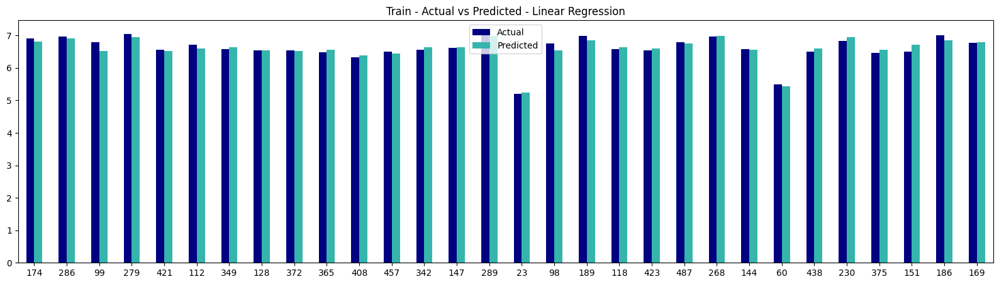

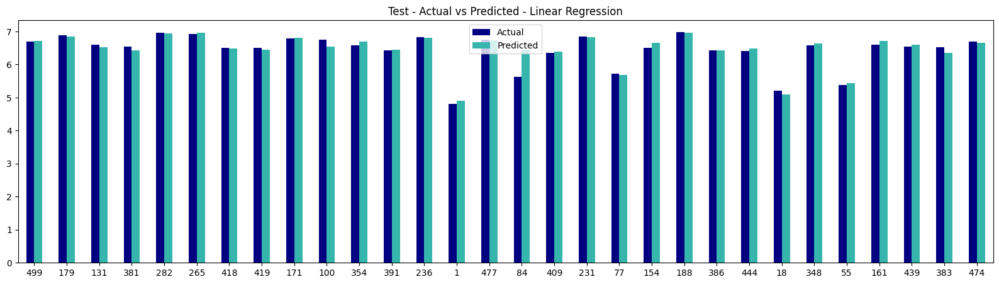

In [89]:
lin_train_result, lin_test_result = get_model_result(model=lin_reg, model_name="Linear Regression")
models.append(lin_train_result)
models.append(lin_test_result)

In [90]:
# Ridge 
ridge = Ridge()
ridge.fit(X_train_scaled, y_train)

Ridge()

{'Model': 'Ridge Regression Train', 'MAE': 0.1, 'MSE': 0.02, 'RMSE': 0.15, 'R2 Score': 0.93}
{'Model': 'Ridge Regression Test', 'MAE': 0.09, 'MSE': 0.02, 'RMSE': 0.13, 'R2 Score': 0.95}


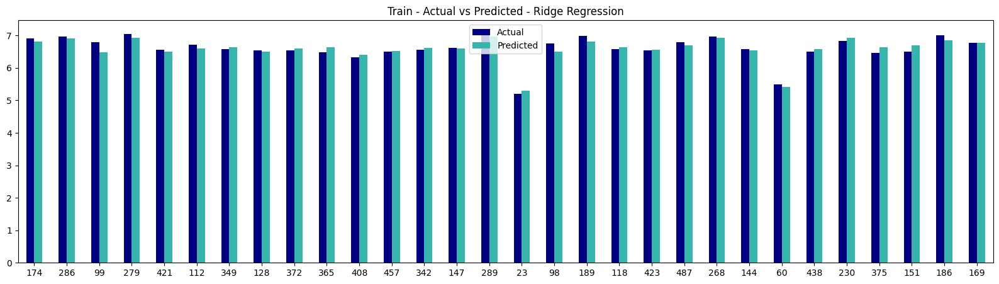

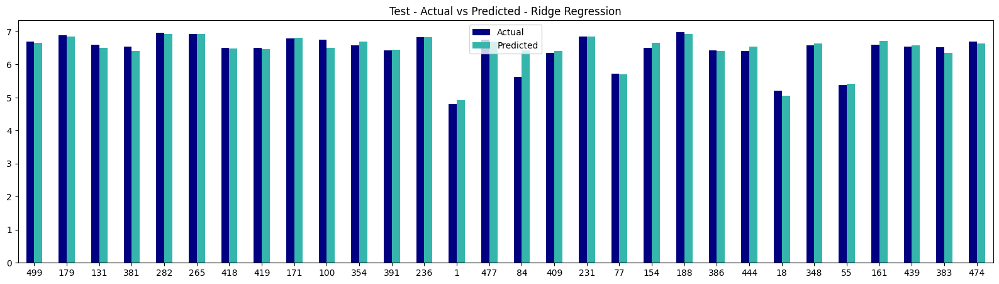

In [91]:
ridge_train_result, ridge_test_result = get_model_result(model=ridge, model_name="Ridge Regression")
models.append(ridge_train_result)
models.append(ridge_test_result)


In [92]:
#Lasso algorithm
lasso = Lasso()
lasso.fit(X_train_scaled, y_train)

Lasso()

{'Model': 'Lasso Regression Train', 'MAE': 0.39, 'MSE': 0.29, 'RMSE': 0.54, 'R2 Score': -0.01}
{'Model': 'Lasso Regression Test', 'MAE': 0.4, 'MSE': 0.31, 'RMSE': 0.56, 'R2 Score': -0.0}


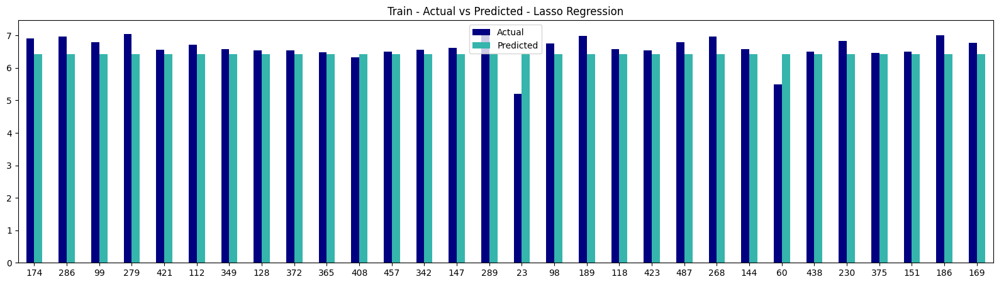

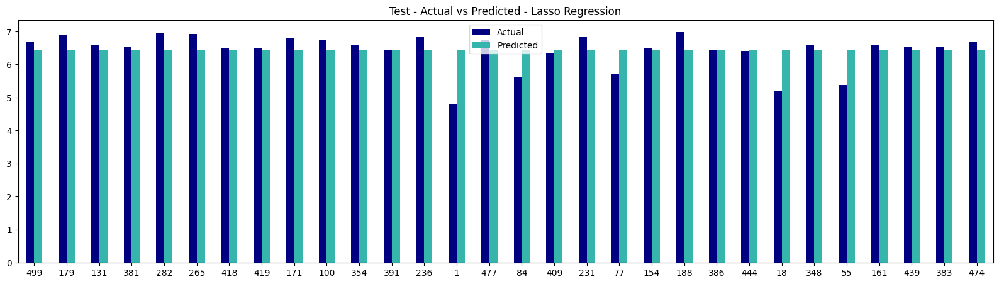

In [93]:
lasso_train_result, lasso_test_result = get_model_result(model=lasso, model_name="Lasso Regression")
models.append(lasso_train_result)
models.append(lasso_test_result)


In [94]:
#Gradient Boosting Regressor 
gbr = GradientBoostingRegressor()
gbr.fit(X_train_scaled, y_train)

GradientBoostingRegressor()

{'Model': 'Gradient Boosting Regression Train', 'MAE': 0.04, 'MSE': 0.0, 'RMSE': 0.06, 'R2 Score': 0.99}
{'Model': 'Gradient Boosting Regression Test', 'MAE': 0.04, 'MSE': 0.01, 'RMSE': 0.09, 'R2 Score': 0.97}


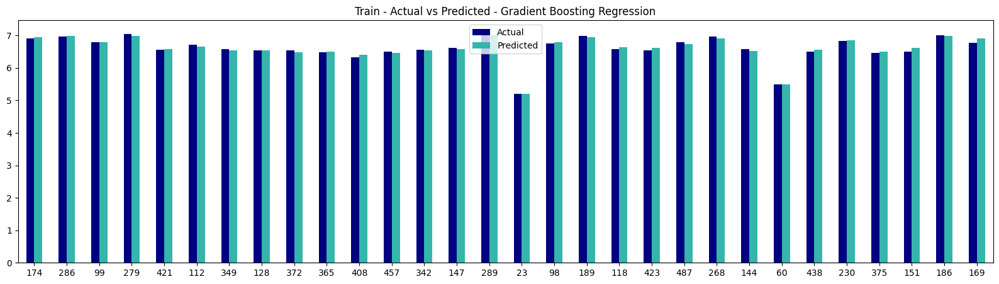

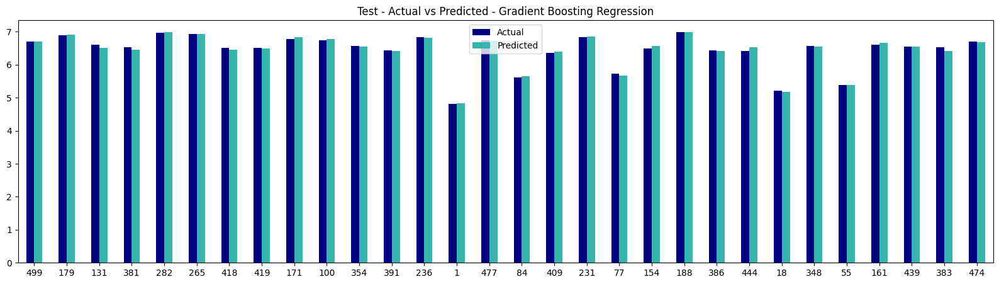

In [95]:
gbr_train_result, gbr_test_result = get_model_result(model=gbr, model_name="Gradient Boosting Regression")
models.append(gbr_train_result)
models.append(gbr_test_result)

In [96]:
# Elastic net regresor 
elastic = ElasticNet()
elastic.fit(X_train_scaled, y_train)

ElasticNet()

{'Model': 'Elastic Regression Train', 'MAE': 0.39, 'MSE': 0.29, 'RMSE': 0.54, 'R2 Score': -0.01}
{'Model': 'Elastic Regression Test', 'MAE': 0.4, 'MSE': 0.31, 'RMSE': 0.56, 'R2 Score': -0.0}


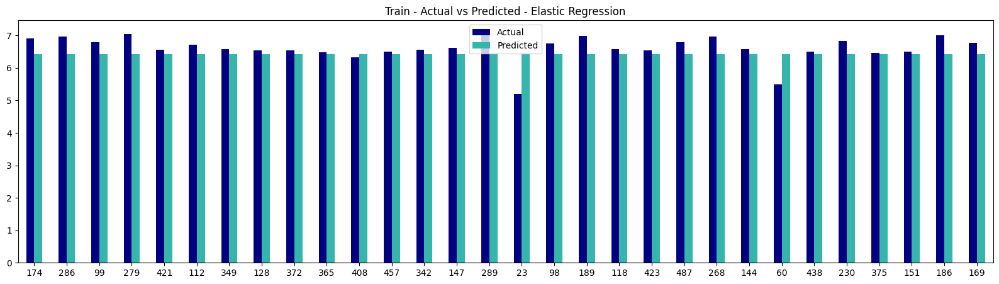

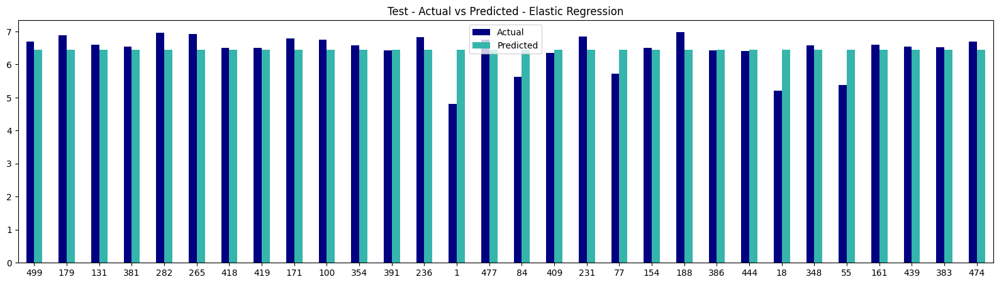

In [97]:
elastic_train_result, elastic_test_result = get_model_result(model=elastic, model_name="Elastic Regression")
models.append(elastic_train_result)
models.append(elastic_test_result)


In [98]:
# Random forest regressor 
rf = RandomForestRegressor()
rf.fit(X_train_scaled, y_train)

RandomForestRegressor()

{'Model': 'Random Forest Regression Train', 'MAE': 0.04, 'MSE': 0.0, 'RMSE': 0.05, 'R2 Score': 0.99}
{'Model': 'Random Forest Regression Test', 'MAE': 0.04, 'MSE': 0.01, 'RMSE': 0.08, 'R2 Score': 0.98}


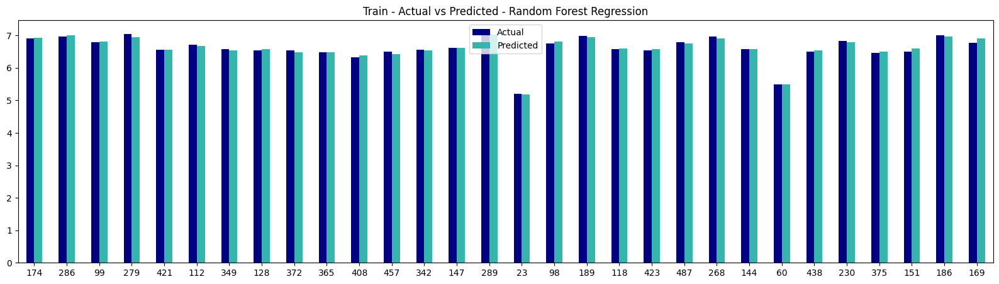

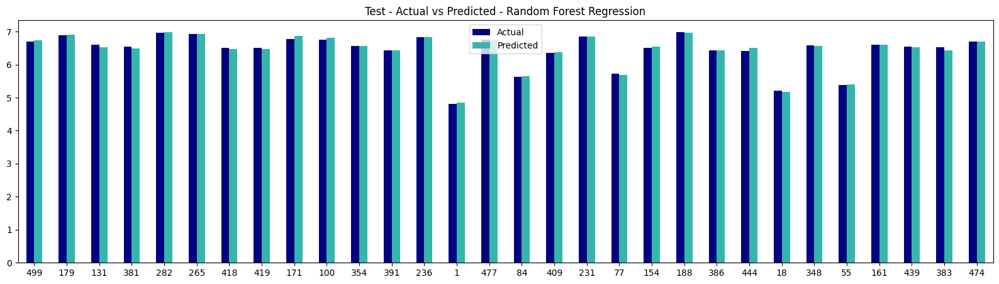

In [99]:
rf_train_result, rf_test_result = get_model_result(model=rf, model_name="Random Forest Regression")
models.append(rf_train_result)
models.append(rf_test_result)


In [100]:
# Decision Tree Regressor 
dtr = DecisionTreeRegressor()
dtr.fit(X_train_scaled, y_train)

DecisionTreeRegressor()

{'Model': 'Decision Tree Regression Train', 'MAE': 0.05, 'MSE': 0.0, 'RMSE': 0.07, 'R2 Score': 0.99}
{'Model': 'Decision Tree Regression Test', 'MAE': 0.04, 'MSE': 0.01, 'RMSE': 0.1, 'R2 Score': 0.97}


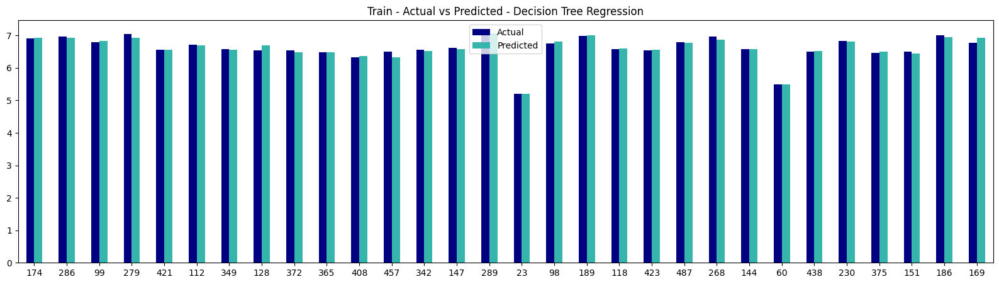

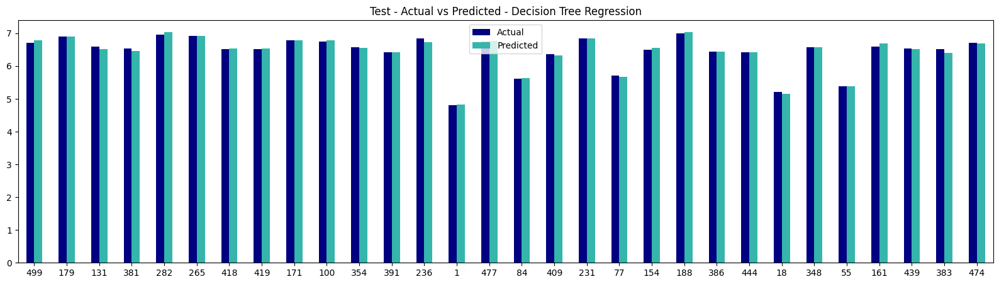

In [101]:
dtr_train_result, dtr_test_result = get_model_result(model=dtr, model_name="Decision Tree Regression")
models.append(dtr_train_result)
models.append(dtr_test_result)

In [102]:
 # Ada Boost Regressor 
ada = AdaBoostRegressor()
ada.fit(X_train_scaled, y_train)

AdaBoostRegressor()

{'Model': 'AdaBoost Regression Train', 'MAE': 0.07, 'MSE': 0.01, 'RMSE': 0.09, 'R2 Score': 0.97}
{'Model': 'AdaBoost Regression Test', 'MAE': 0.07, 'MSE': 0.01, 'RMSE': 0.11, 'R2 Score': 0.96}


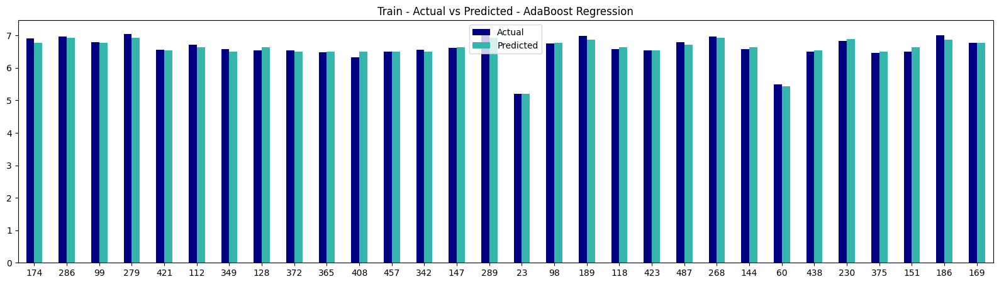

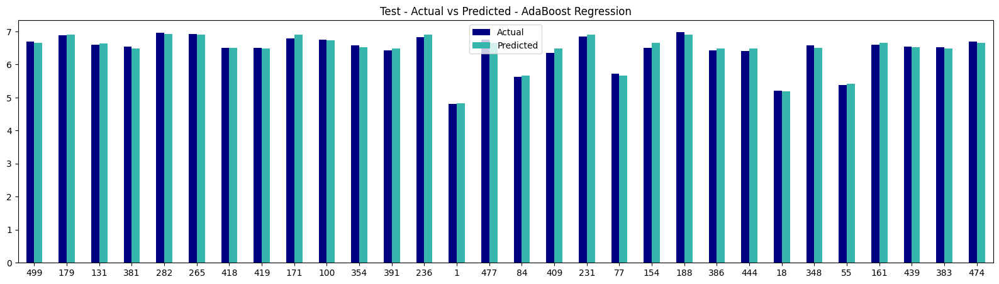

In [103]:
ada_train_result, ada_test_result = get_model_result(model=ada, model_name="AdaBoost Regression")
models.append(ada_train_result)
models.append(ada_test_result)

In [104]:
# Support Vector Machine regressor 
svr = SVR()
svr.fit(X_train_scaled, y_train)

SVR()

{'Model': 'SVR Regression Train', 'MAE': 0.09, 'MSE': 0.02, 'RMSE': 0.14, 'R2 Score': 0.93}
{'Model': 'SVR Regression Test', 'MAE': 0.08, 'MSE': 0.02, 'RMSE': 0.13, 'R2 Score': 0.95}


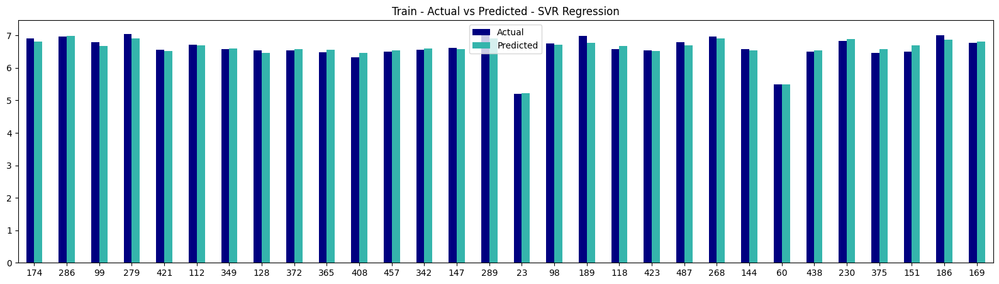

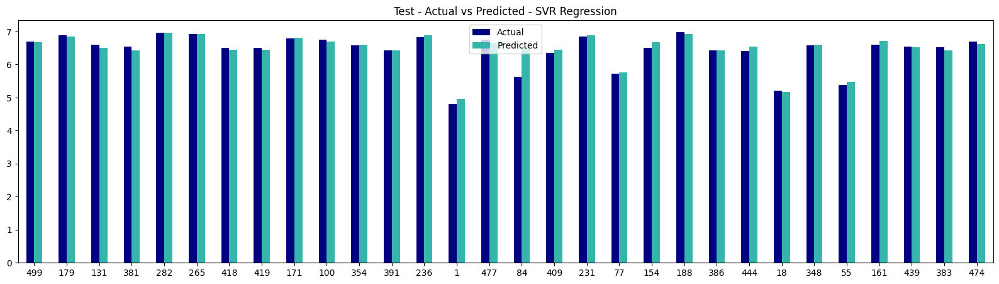

In [105]:
svr_train_result, svr_test_result = get_model_result(model=svr, model_name="SVR Regression")
models.append(svr_train_result)
models.append(svr_test_result)


In [106]:
result_RSnoout_df = pd.DataFrame(models)
result_RSnoout_df


,Model,MAE,MSE,RMSE,R2 Score
0,Linear Regression Train,0.10,0.02,0.14,0.93
1,Linear Regression Test,0.08,0.01,0.12,0.95
2,Ridge Regression Train,0.10,0.02,0.15,0.93
3,Ridge Regression Test,0.09,0.02,0.13,0.95
4,Lasso Regression Train,0.39,0.29,0.54,-0.01
5,Lasso Regression Test,0.40,0.31,0.56,-0.00
6,Gradient Boosting Regression Train,0.04,0.00,0.06,0.99
7,Gradient Boosting Regression Test,0.04,0.01,0.09,0.97
8,Elastic Regression Train,0.39,0.29,0.54,-0.01
9,Elastic Regression Test,0.40,0.31,0.56,-0.00


In [112]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define the RNN model
def create_model():
    model = Sequential()
    model.add(SimpleRNN(64, input_shape=(1, X_train_scaled.shape[1])))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

# Reshape the input data to have a 3D shape
X_train_reshaped = np.reshape(X_train_scaled, (X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_reshaped = np.reshape(X_test_scaled, (X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

# Create the model
model = KerasRegressor(build_fn=create_model, verbose=0)

# Define the parameter grid for grid search
param_grid = {
    'epochs': [10, 20, 30],
    'batch_size': [16, 32, 64]
}

# Perform grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')
grid_result = grid_search.fit(X_train_reshaped, y_train)

# Get the best model
best_model = grid_result.best_estimator_

# Make predictions
y_train_pred = best_model.predict(X_train_reshaped)
y_test_pred = best_model.predict(X_test_reshaped)

# Calculate the evaluation metrics for train and test data
mae_train = mean_absolute_error(y_train, y_train_pred)
rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)
r2_train = r2_score(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)

mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)
r2_test = r2_score(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)

# Print the evaluation metrics for train and test data
print("Train Set Evaluation:")
print("MAE:", mae_train)
print("RMSE:", rmse_train)
print("R^2:", r2_train)
print("MSE:", mse_train)

print("\nTest Set Evaluation:")
print("MAE:", mae_test)
print("RMSE:", rmse_test)
print("R^2:", r2_test)
print("MSE:", mse_test)

# Evaluate model
evaluation_results = grid_result.cv_results_
best_params = grid_result.best_params_
best_score = grid_result.best_score_

print("Best Parameters:", best_params)
print("Best Score (neg_mean_squared_error):", best_score)
print("Evaluation Results:", evaluation_results)


Train Set Evaluation:
MAE: 0.1825029670232394
RMSE: 0.23777500394947607
R^2: 0.803995045802821
MSE: 0.05653695250317336

Test Set Evaluation:
MAE: 0.188915383634498
RMSE: 0.2625008452514147
R^2: 0.7789654419312658
MSE: 0.06890669375770717
Best Parameters: {'batch_size': 16, 'epochs': 30}
Best Score (neg_mean_squared_error): -0.05325191000225107
Evaluation Results: {'mean_fit_time': array([1.52430805, 2.20301819, 4.20538481, 1.87351886, 1.96628364,
       1.75305033, 1.59176087, 1.42891359, 2.15033587]), 'std_fit_time': array([0.07233256, 0.46317019, 1.5492456 , 0.54085945, 0.28396389,
       0.08302266, 0.20192025, 0.06396758, 0.486667  ]), 'mean_score_time': array([0.20779785, 0.2293485 , 0.86661196, 0.21439815, 0.24747801,
       0.20017465, 0.26541964, 0.20095277, 0.24161847]), 'std_score_time': array([0.01075671, 0.04221629, 0.67765078, 0.02293466, 0.04141088,
       0.00543321, 0.05399159, 0.0086977 , 0.03378971]), 'param_batch_size': masked_array(data=[16, 16, 16, 32, 32, 32, 64,

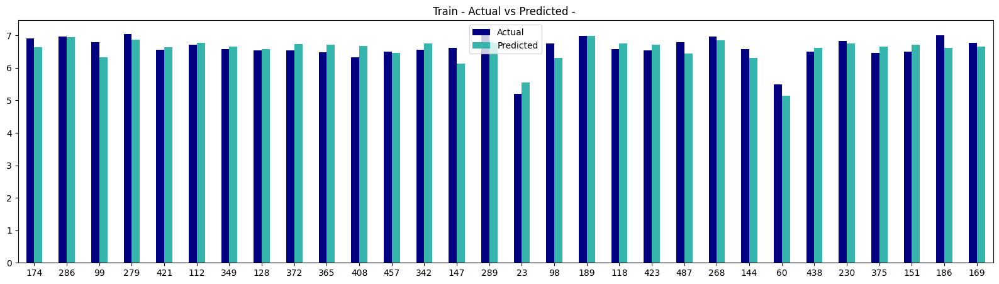

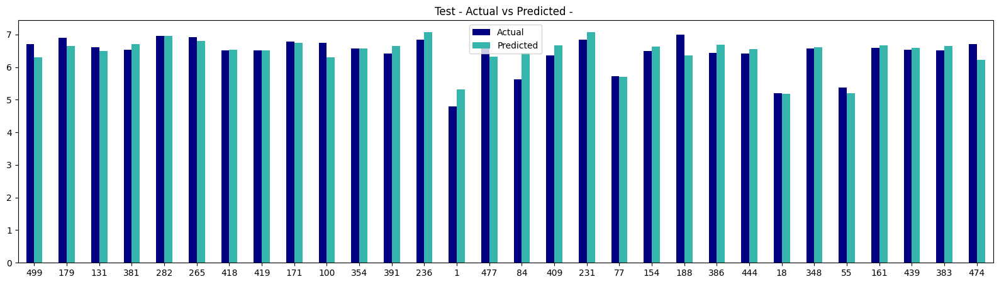

In [113]:
# Reshape the arrays to be one-dimensional
y_train_reshaped = np.squeeze(y_train[:30])
y_train_pred_reshaped = np.squeeze(y_train_pred[:30])
y_test_reshaped = np.squeeze(y_test[:30])
y_test_pred_reshaped = np.squeeze(y_test_pred[:30])


# Create a DataFrame with reshaped arrays
rf_df_tmp = pd.DataFrame({"Actual": y_train_reshaped, "Predicted": y_train_pred_reshaped})
rf_df_tmp_test = pd.DataFrame({"Actual": y_test_reshaped, "Predicted": y_test_pred_reshaped})

# Plot the bar chart
rf_df_tmp.plot(figsize=(20, 5), kind="bar", rot=0, title=f"Train - Actual vs Predicted - ", color=custom_palette_bar)
rf_df_tmp_test.plot(figsize=(20, 5), kind="bar", rot=0, title=f"Test - Actual vs Predicted - ", color=custom_palette_bar)
plt.show()

In [109]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasRegressor

# Assuming you have input data 'X_train_scaled', 'X_test_scaled', and target data 'y_train', 'y_test'
# X_train_scaled.shape = (num_train_samples, input_dim)
# y_train.shape = (num_train_samples, output_dim)
# X_test_scaled.shape = (num_test_samples, input_dim)
# y_test.shape = (num_test_samples, output_dim)

# Reshape the input data to have a 3D shape
X_train_reshaped = np.reshape(X_train_scaled, (X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_reshaped = np.reshape(X_test_scaled, (X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

# Function to create the LSTM model
def create_model():
    model = Sequential()
    model.add(LSTM(units=64, input_shape=(1, X_train_scaled.shape[1])))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

# Create the KerasRegressor wrapper for the model
model = KerasRegressor(build_fn=create_model, verbose=0)

# Define the parameter grid for grid search
param_grid = {
    'batch_size': [16, 32, 64],
    'epochs': [10, 20,30]
}


# Perform grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=3)
grid_search.fit(X_train_reshaped, y_train)

# Get the best model
best_model = grid_search.best_estimator_

# Train the best model
best_model.fit(X_train_reshaped, y_train)

# Make predictions on the train and test data
y_train_pred = best_model.predict(X_train_reshaped)
y_test_pred = best_model.predict(X_test_reshaped)

# Calculate the evaluation metrics for train and test data
mae_train = mean_absolute_error(y_train, y_train_pred)
rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)
r2_train = r2_score(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)

mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)
r2_test = r2_score(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)

# Print the evaluation metrics for train and test data
print("Train Set Evaluation:")
print("MAE:", mae_train)
print("RMSE:", rmse_train)
print("R^2:", r2_train)
print("MSE:", mse_train)

print("\nTest Set Evaluation:")
print("MAE:", mae_test)
print("RMSE:", rmse_test)
print("R^2:", r2_test)
print("MSE:", mse_test)

Train Set Evaluation:
MAE: 0.1740158479015752
RMSE: 0.23094761748193152
R^2: 0.8150894773381867
MSE: 0.053336802020580554

Test Set Evaluation:
MAE: 0.17753469361133095
RMSE: 0.24402095177367356
R^2: 0.8089913651536649
MSE: 0.05954622490452951


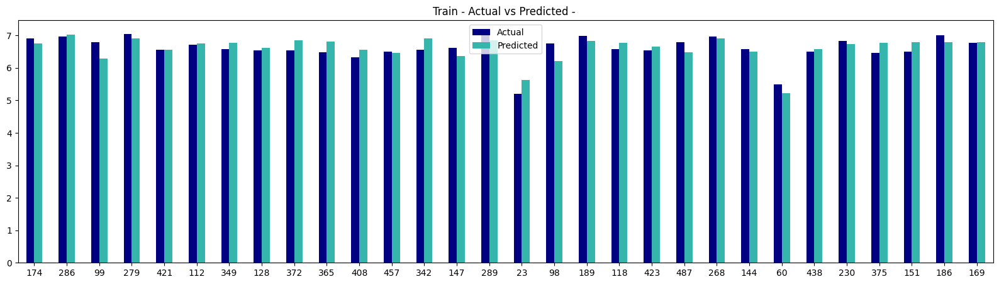

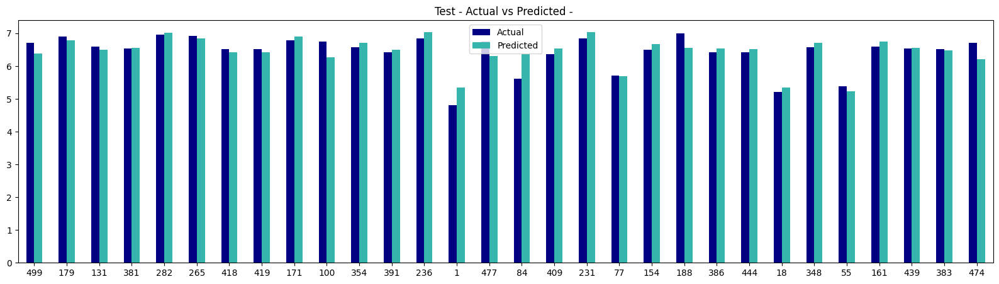

In [111]:
# Reshape the arrays to be one-dimensional
y_train_reshaped = np.squeeze(y_train[:30])
y_train_pred_reshaped = np.squeeze(y_train_pred[:30])
y_test_reshaped = np.squeeze(y_test[:30])
y_test_pred_reshaped = np.squeeze(y_test_pred[:30])


# Create a DataFrame with reshaped arrays
rf_df_tmp = pd.DataFrame({"Actual": y_train_reshaped, "Predicted": y_train_pred_reshaped})
rf_df_tmp_test = pd.DataFrame({"Actual": y_test_reshaped, "Predicted": y_test_pred_reshaped})

# Plot the bar chart
rf_df_tmp.plot(figsize=(20, 5), kind="bar", rot=0, title=f"Train - Actual vs Predicted - ", color=custom_palette_bar)
rf_df_tmp_test.plot(figsize=(20, 5), kind="bar", rot=0, title=f"Test - Actual vs Predicted - ", color=custom_palette_bar)
plt.show()

result_RS_df - for random split 
result_RSnoout_df - no outlier random

result_te_df - for target encoder on all imputed tickers
result_oe_df - for ordinal encoder on all imputed tickers

If the R-squared (R2) score is 0 for both Lasso and Elastic Net regression models, it means that the models are not able to explain any of the variance in the target variable based on the provided predictor variables.

An R2 score of 0 indicates that the models are unable to capture any meaningful relationship between the predictor variables and the target variable. It suggests that the chosen predictor variables do not have a significant impact on the target variable, and the models cannot accurately predict or explain the variability in the target variable.

In such cases, it is important to reevaluate the choice of predictor variables, consider other potential factors that may influence the target variable, or explore alternative regression techniques to improve the model's performance and ability to explain the variance in the data.